<a href="https://colab.research.google.com/github/AyrusCodes/Main-Project/blob/main/New_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
!unzip /content/mal_dataset.zip -d /content/dataset1

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset1/digital_malayalam/р┤Ц/6f6db181-2c42-4e38-ac81-8204e328b714.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/6fb802de-cc43-41b2-bb34-fdf262cf9335.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/728a003c-bbeb-4a4b-bb6e-01089ab54654.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/7a1f81e0-668e-4f13-a982-ff824ca8d9ff.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/802cf4af-2b9e-4649-af10-78a36e2fdb9c.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/80e492bb-a18e-4c31-a2b4-ea7e033dd128.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/89c20e76-5649-4bf2-9cf3-467a8931b740.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/8bae5344-21c2-47fd-9894-d5718429cab8.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/9129c18e-80bc-4873-8a22-ab9e27bf4e29.png  
  inflating: /content/dataset1/digital_malayalam/р┤Ц/97cd821d-beb7-46b5-b851-0b411c0e

In [33]:
!rm -r /content/dataset/digital_malayalam

In [27]:
import chardet

corrupted_bytes = "р╡Н".encode("utf-8", errors="ignore")  # Convert to bytes
detected_encoding = chardet.detect(corrupted_bytes)  # Detect encoding

print("Detected Encoding:", detected_encoding)


Detected Encoding: {'encoding': 'utf-8', 'confidence': 0.87625, 'language': ''}


UnicodeEncodeError: 'latin-1' codec can't encode characters in position 0-2: ordinal not in range(256)

In [11]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import cv2
import os
from sklearn.model_selection import train_test_split

# Define constants
IMG_HEIGHT = 48
IMG_WIDTH = 48
NUM_CLASSES = 50  # Adjust based on your dataset

# Load dataset
def load_data(data_dir):
    images, labels = [], []
    class_names = sorted(os.listdir(data_dir))
    class_dict = {class_name: idx for idx, class_name in enumerate(class_names)}

    for class_name in class_names:
        class_path = os.path.join(data_dir, class_name)
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                continue  # Skip corrupted images
            img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
            img = img / 255.0  # Normalize
            images.append(img)
            labels.append(class_dict[class_name])

    return np.array(images).reshape(-1, IMG_HEIGHT, IMG_WIDTH, 1), np.array(labels), class_dict

# Load data
data_dir = "/content/dataset"
X, y, class_dict = load_data(data_dir)
y = tf.keras.utils.to_categorical(y, num_classes=NUM_CLASSES)

# Split into training and validation
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Basic data augmentation
datagen = ImageDataGenerator(
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.05
)
datagen.fit(X_train)

# Define a straightforward CNN model
model = Sequential([
    # First convolutional block
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, 1)),
    MaxPooling2D(pool_size=(2, 2)),

    # Second convolutional block
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    # Third convolutional block
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    # Fully connected layers
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(NUM_CLASSES, activation='softmax')
])

# Compile model with standard parameters
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Add simple callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=(X_val, y_val),
    epochs=50,
    callbacks=[early_stopping]
)

# Save model
model.save("malayalam_character_recognition.h5")

# Simple prediction function
def predict_character(image_path, model, class_dict):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return "Error: Could not read image"

    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    img = img / 255.0
    img = img.reshape(1, IMG_HEIGHT, IMG_WIDTH, 1)

    pred = model.predict(img)[0]
    class_idx = np.argmax(pred)
    confidence = float(pred[class_idx])

    return list(class_dict.keys())[class_idx], confidence

# Example usage
# predicted_char, confidence = predict_character("path_to_test_image", model, class_dict)
# print(f"Predicted Character: {predicted_char} (Confidence: {confidence:.2f})")

Epoch 1/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.0238 - loss: 3.9101 - val_accuracy: 0.0213 - val_loss: 3.9026
Epoch 2/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0282 - loss: 3.9010 - val_accuracy: 0.0213 - val_loss: 3.8949
Epoch 3/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0270 - loss: 3.8937 - val_accuracy: 0.0213 - val_loss: 3.8887
Epoch 4/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0316 - loss: 3.8888 - val_accuracy: 0.0213 - val_loss: 3.8835
Epoch 5/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.0291 - loss: 3.8841 - val_accuracy: 0.0213 - val_loss: 3.8791
Epoch 6/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0295 - loss: 3.8797 - val_accuracy: 0.0213 - val_loss: 3.8756
Epoch 7/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0327 - loss: 3.8774 - val_accuracy: 0.0213 - val_loss: 3.8725
Epoch 8/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0314 - loss: 3.8740 - val_acc

In [38]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import cv2
import os
from sklearn.model_selection import train_test_split

# Define constants
IMG_HEIGHT = 48
IMG_WIDTH = 48
NUM_CLASSES = 50  # Adjust based on your dataset

def load_data(data_dir):
    images, labels = [], []
    class_names = sorted(os.listdir(data_dir))
    class_dict = {class_name: idx for idx, class_name in enumerate(class_names)}

    for class_name in class_names:
        class_path = os.path.join(data_dir, class_name)
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                continue  # Skip corrupted images
            img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
            img = img / 255.0  # Normalize
            images.append(img)
            labels.append(class_dict[class_name])

    return np.array(images).reshape(-1, IMG_HEIGHT, IMG_WIDTH, 1), np.array(labels), class_dict

# Load data
data_dir = "/content/dataset"
X, y, class_dict = load_data(data_dir)
y = tf.keras.utils.to_categorical(y, num_classes=NUM_CLASSES)

# Split into training and validation
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Basic data augmentation
datagen = ImageDataGenerator(
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.05
)
datagen.fit(X_train)

# Define a CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, 1)),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    # Add Dense layers directly
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(NUM_CLASSES, activation='softmax')
])

# Compile model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Add early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    epochs=50,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping]
)

# Save model
model.save("malayalam_character_recognition.h5")

def predict_character(image_path, model, class_dict):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return "Error: Could not read image", 0.0

    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    img = img / 255.0
    img = img.reshape(1, IMG_HEIGHT, IMG_WIDTH, 1)

    pred = model.predict(img)[0]
    class_idx = np.argmax(pred)
    confidence = float(pred[class_idx])

    # Get class name from index
    inverse_class_dict = {v: k for k, v in class_dict.items()}
    predicted_class = inverse_class_dict[class_idx]

    return predicted_class, confidence

# Example usage
# predicted_char, confidence = predict_character("path_to_test_image", model, class_dict)
# print(f"Predicted Character: {predicted_char} (Confidence: {confidence:.2f})")

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


153/153 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - accuracy: 0.0229 - loss: 3.9100 - val_accuracy: 0.0213 - val_loss: 3.9027
Epoch 2/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0289 - loss: 3.9016 - val_accuracy: 0.0213 - val_loss: 3.8951
Epoch 3/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.0307 - loss: 3.8947 - val_accuracy: 0.0213 - val_loss: 3.8887
Epoch 4/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0263 - loss: 3.8898 - val_accuracy: 0.0213 - val_loss: 3.8836
Epoch 5/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0332 - loss: 3.8841 - val_accuracy: 0.0213 - val_loss: 3.8792
Epoch 6/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0353 - loss: 3.8813 - val_accuracy: 0.0213 - val_loss: 3.8758
Epoch 7/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.0308 - loss: 3.8769 - val_accuracy: 0.0213 - val_loss: 3.8726
Epoch 8/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.0233 - loss: 3.8761 - val_accuracy: 0.021

Enter the path of the image: /content/pic2.jpeg


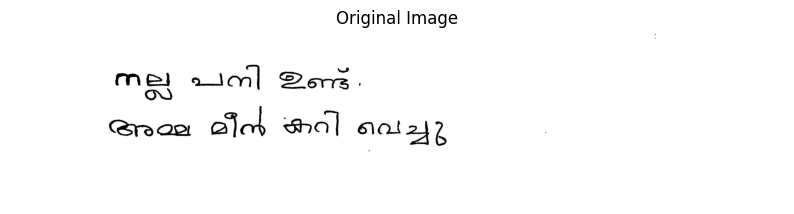

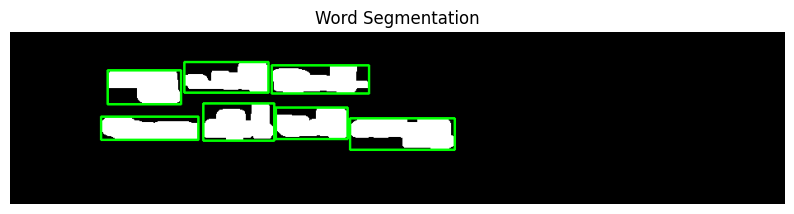

<Figure size 1500x1000 with 0 Axes>

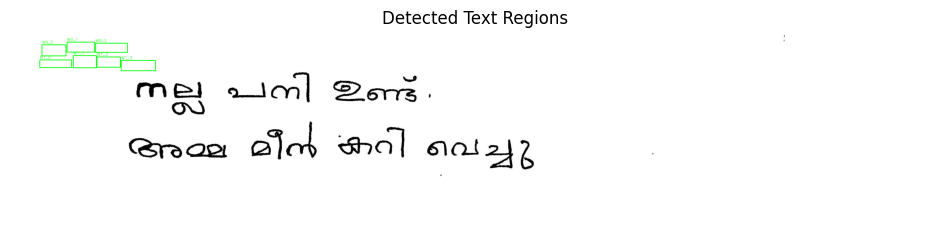

Recognized Text:





In [15]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import os
from matplotlib import pyplot as plt
from scipy import ndimage
from matplotlib import cm as cm

# Load trained model
model = load_model("malayalam_character_recognition.h5")

# Load class dictionary
data_dir = "/content/dataset"
class_names = sorted(os.listdir(data_dir))
class_dict = {idx: class_name for idx, class_name in enumerate(class_names)}

# Function to preprocess image for prediction
def preprocess_image(img):
    img = cv2.resize(img, (32, 32)) / 255.0
    return img.reshape(1, 32, 32, 1)

# Function for character prediction
def predict_character(img):
    img = preprocess_image(img)
    pred = model.predict(img)
    return class_dict[np.argmax(pred)]

# Edge detection functions
def _edge_detect(im):
    # Handle grayscale images
    if len(im.shape) == 2:
        return _sobel_detect(im)
    else:
        return np.max(np.array([_sobel_detect(im[:,:, 0]),
                               _sobel_detect(im[:,:, 1]),
                               _sobel_detect(im[:,:, 2])]), axis=0)

def _sobel_detect(channel):
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def sort_words(boxes):
    # Sort boxes horizontally (by x-coordinate)
    return sorted(boxes, key=lambda box: box[2])

def sort_boxes(boxes):
    if not boxes:
        return []

    # Group boxes by lines based on vertical position
    # Using a more robust approach with vertical overlap
    boxes_sorted = sorted(boxes, key=lambda box: box[0])  # Sort by top y-coordinate

    lines = []
    current_line = [boxes_sorted[0]]

    for box in boxes_sorted[1:]:
        prev_box = current_line[-1]

        # Check if current box overlaps vertically with previous box
        overlap = min(prev_box[1], box[1]) - max(prev_box[0], box[0])
        overlap_ratio = overlap / min(prev_box[1] - prev_box[0], box[1] - box[0])

        if overlap_ratio > 0.3:  # If significant vertical overlap, add to current line
            current_line.append(box)
        else:
            # Start a new line
            lines.append(sort_words(current_line))
            current_line = [box]

    if current_line:
        lines.append(sort_words(current_line))

    return lines

def clipping_image(binary_img):
    """Clip image to its content boundaries"""
    # Find non-zero rows and columns
    rows = np.any(binary_img, axis=1)
    cols = np.any(binary_img, axis=0)

    if not np.any(rows) or not np.any(cols):
        return binary_img, [0, binary_img.shape[0], 0, binary_img.shape[1]]

    # Find the boundaries
    y_min, y_max = np.where(rows)[0][[0, -1]]
    x_min, x_max = np.where(cols)[0][[0, -1]]

    # Add a small padding
    y_min = max(0, y_min - 2)
    y_max = min(binary_img.shape[0], y_max + 2)
    x_min = max(0, x_min - 2)
    x_max = min(binary_img.shape[1], x_max + 2)

    # Crop the image
    imgcrop = binary_img[y_min:y_max, x_min:x_max]

    return imgcrop, [y_min, y_max, x_min, x_max]

def padding_resizing_image(img):
    """Add padding and resize image to 32x32 for model input"""
    # Add padding
    padding = 2
    img = cv2.copyMakeBorder(img, padding, padding, padding, padding,
                            cv2.BORDER_CONSTANT, value=0)

    # Resize to 32x32
    try:
        img = cv2.resize(np.uint8(img), (32, 32), interpolation=cv2.INTER_AREA)
        return img
    except Exception as e:
        print(f"Error in resizing: {e}")
        return img

def filter_contours(contours, min_area=100, max_area=None):
    """Filter contours based on area and aspect ratio"""
    filtered_contours = []

    for contour in contours:
        area = cv2.contourArea(contour)
        if area < min_area:
            continue

        if max_area and area > max_area:
            continue

        # Get bounding rectangle
        x, y, w, h = cv2.boundingRect(contour)
        aspect_ratio = w / h if h > 0 else 0

        # Filter extremely elongated contours
        if aspect_ratio > 10 or aspect_ratio < 0.1:
            continue

        filtered_contours.append(contour)

    return filtered_contours

def segmentation(img, sequence, debug=False):
    """
    Segment the image into words or characters

    Args:
        img: Input image
        sequence: "word" or "character"
        debug: Whether to display debug images

    Returns:
        binary_img: Processed binary image
        boxes: List of bounding boxes [y_min, y_max, x_min, x_max]
    """
    # Make a copy to avoid modifying the original
    img_copy = img.copy()

    # Convert to grayscale if not already
    if len(img_copy.shape) == 3:
        gray = cv2.cvtColor(img_copy, cv2.COLOR_BGR2GRAY)
    else:
        gray = img_copy

    # Resize for word segmentation
    if sequence == "word":
        # Resize maintaining aspect ratio
        target_width = 940
        height = int(gray.shape[0] * (target_width / gray.shape[1]))
        gray = cv2.resize(gray, (target_width, height))

        # Apply preprocessing
        blurred = cv2.GaussianBlur(gray, (5, 5), 18)
        edges = _sobel_detect(blurred)

        # Threshold
        _, binary = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Morphological operations to connect text components
        kernel = np.ones((15, 5), np.uint8)
        binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

        # Dilate to merge characters into words
        kernel = np.ones((3, 15), np.uint8)
        binary = cv2.dilate(binary, kernel, iterations=1)

        # Find contours
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Filter contours
        contours = filter_contours(contours, min_area=200)

        # Get bounding boxes [y_min, y_max, x_min, x_max]
        boxes = []
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            boxes.append([y, y+h, x, x+w])

    elif sequence == "character":
        # Keep original size for character segmentation

        # Apply adaptive thresholding for better character isolation
        binary = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY_INV, 11, 2)

        # Remove noise
        kernel = np.ones((2, 2), np.uint8)
        binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

        # Find contours
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Filter contours
        contours = filter_contours(contours, min_area=25)

        # Get bounding boxes [y_min, y_max, x_min, x_max]
        boxes = []
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            boxes.append([y, y+h, x, x+w])

    if debug:
        # Display the binary image and contours
        debug_img = cv2.cvtColor(binary, cv2.COLOR_GRAY2BGR)
        for box in boxes:
            cv2.rectangle(debug_img, (box[2], box[0]), (box[3], box[1]), (0, 255, 0), 2)

        plt.figure(figsize=(10, 6))
        plt.imshow(debug_img)
        plt.title(f"{sequence.capitalize()} Segmentation")
        plt.axis('off')
        plt.show()

    return binary, boxes

def recognize_text(image_path=None):
    """
    Main function to recognize text in an image

    Args:
        image_path: Path to the image file, if None, will prompt user

    Returns:
        output_text: Recognized text
    """
    if image_path is None:
        image_path = input("Enter the path of the image: ")

    if not os.path.exists(image_path):
        print("Invalid path. Please try again.")
        return recognize_text()

    # Load and preprocess image
    original_img = cv2.imread(image_path)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Display original image
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')
    plt.show()

    # Preprocess image
    kernel = np.ones((3, 3), np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    # Word segmentation with debug=True to show the result
    _, word_boxes = segmentation(img, "word", debug=True)

    if not word_boxes:
        print("No text detected in the image.")
        return ""

    # Sort word boxes
    word_boxes = sort_boxes(word_boxes)

    # Create output visualization
    output_img = original_img.copy()

    # Create a figure to display the segmented characters
    plt.figure(figsize=(15, 10))
    plt.suptitle("Segmented Characters", fontsize=16)

    max_chars_display = 50
    plot_idx = 1
    chars_displayed = 0

    output_text = ""

    # Process each line
    for line_idx, line in enumerate(word_boxes):
        line_text = ""

        # Process each word in the line
        for word_idx, word_box in enumerate(line):
            # Scale coordinates back to original image
            y_min, y_max, x_min, x_max = word_box

            # Draw rectangle around the word
            cv2.rectangle(output_img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            cv2.putText(output_img, f"W{line_idx}_{word_idx}", (x_min, y_min-5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

            # Extract the word region
            word_img = img[y_min:y_max, x_min:x_max]

            # Convert to grayscale for character segmentation
            if len(word_img.shape) == 3:
                word_img_gray = cv2.cvtColor(word_img, cv2.COLOR_RGB2GRAY)
            else:
                word_img_gray = word_img

            # Skip empty word regions
            if word_img_gray.size == 0:
                continue

            # Character segmentation
            _, char_boxes = segmentation(word_img_gray, "character")

            word_text = ""

            # Sort characters from left to right
            char_boxes = sorted(char_boxes, key=lambda box: box[2])

            # Process each character
            for char_idx, char_box in enumerate(char_boxes):
                if chars_displayed >= max_chars_display:
                    break

                # Extract character image
                char_y_min, char_y_max, char_x_min, char_x_max = char_box
                char_img = word_img_gray[char_y_min:char_y_max, char_x_min:char_x_max]

                # Skip if character image is too small
                if char_img.shape[0] < 5 or char_img.shape[1] < 5:
                    continue

                # Process character image
                char_img = padding_resizing_image(char_img)

                # Display the character
                if plot_idx <= max_chars_display:
                    plt.subplot(5, 10, plot_idx)
                    plt.imshow(char_img, cmap='gray')
                    plt.axis('off')

                    # Try to predict the character
                    try:
                        pred_char = predict_character(char_img)
                        plt.title(f"{pred_char}", fontsize=8)
                        word_text += pred_char
                    except Exception as e:
                        plt.title("Error", fontsize=8)
                        print(f"Error predicting character: {e}")

                    plot_idx += 1
                    chars_displayed += 1

            line_text += word_text + " "

        output_text += line_text.strip() + "\n"

    # Display the output image with bounding boxes
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    plt.title("Detected Text Regions")
    plt.axis('off')
    plt.show()

    print("Recognized Text:")
    print(output_text)

    return output_text

# Run text recognition if script is executed directly
if __name__ == "__main__":
    recognize_text()

Enter the path of the image: /content/pic2.jpeg


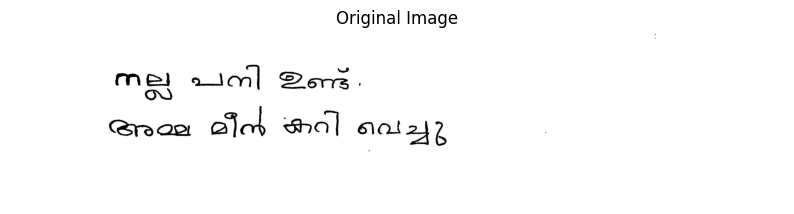

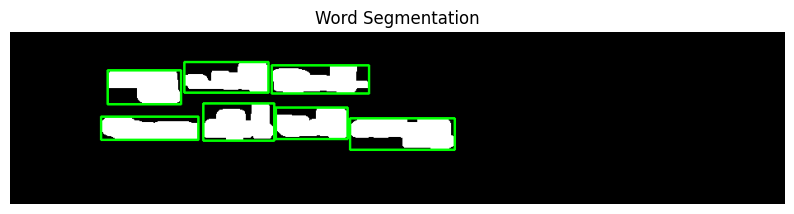

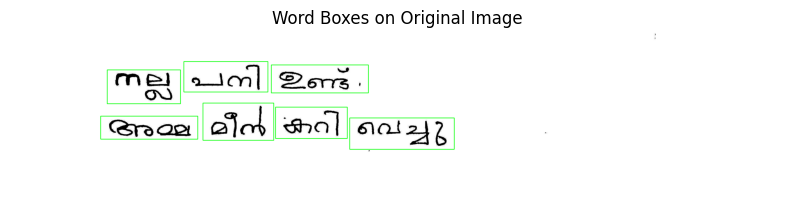

<Figure size 1500x1000 with 0 Axes>

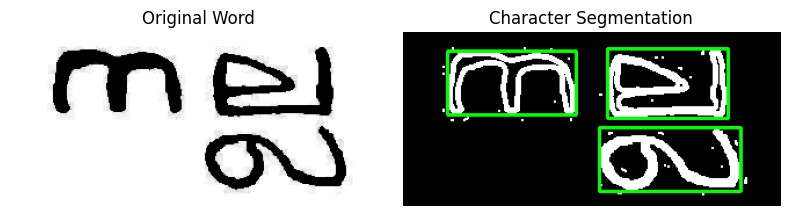

Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_7" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(1, 32, 32, 1), dtype=float32)
  • training=False
  • mask=None
Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_7" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(1, 32, 32, 1), dtype=float32)
  • training=False
  • mask=None
Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_7" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequentia

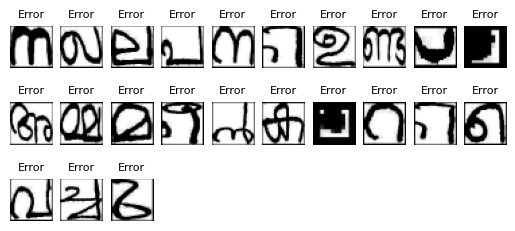

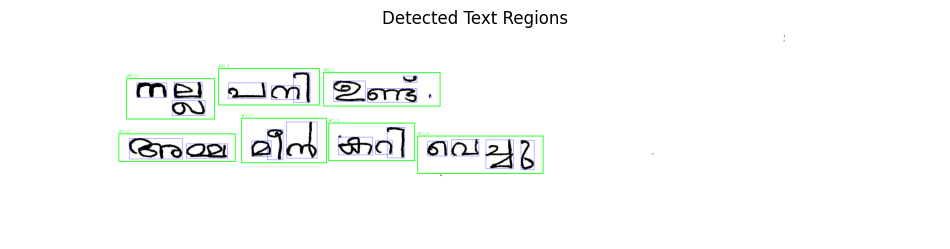

Recognized Text:





In [16]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import os
from matplotlib import pyplot as plt
from scipy import ndimage
from matplotlib import cm as cm

# Load trained model
model = load_model("malayalam_character_recognition.h5")

# Load class dictionary
data_dir = "/content/dataset"
class_names = sorted(os.listdir(data_dir))
class_dict = {idx: class_name for idx, class_name in enumerate(class_names)}

# Function to preprocess image for prediction
def preprocess_image(img):
    img = cv2.resize(img, (32, 32)) / 255.0
    return img.reshape(1, 32, 32, 1)

# Function for character prediction
def predict_character(img):
    img = preprocess_image(img)
    pred = model.predict(img)
    return class_dict[np.argmax(pred)]

# Edge detection functions
def _edge_detect(im):
    # Handle grayscale images
    if len(im.shape) == 2:
        return _sobel_detect(im)
    else:
        return np.max(np.array([_sobel_detect(im[:,:, 0]),
                               _sobel_detect(im[:,:, 1]),
                               _sobel_detect(im[:,:, 2])]), axis=0)

def _sobel_detect(channel):
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def sort_words(boxes):
    # Sort boxes horizontally (by x-coordinate)
    return sorted(boxes, key=lambda box: box[2])

def sort_boxes(boxes):
    if not boxes:
        return []

    # Group boxes by lines based on vertical position and overlap
    boxes_sorted = sorted(boxes, key=lambda box: box[0])  # Sort by top y-coordinate

    lines = []
    current_line = [boxes_sorted[0]]

    for box in boxes_sorted[1:]:
        prev_box = current_line[-1]

        # Check if current box overlaps vertically with previous box
        overlap = min(prev_box[1], box[1]) - max(prev_box[0], box[0])
        overlap_ratio = overlap / min(prev_box[1] - prev_box[0], box[1] - box[0])

        if overlap_ratio > 0.3:  # If significant vertical overlap, add to current line
            current_line.append(box)
        else:
            # Start a new line
            lines.append(sort_words(current_line))
            current_line = [box]

    if current_line:
        lines.append(sort_words(current_line))

    return lines

def padding_resizing_image(img):
    """Add padding and resize image to 32x32 for model input"""
    # Add padding
    padding = 2
    img = cv2.copyMakeBorder(img, padding, padding, padding, padding,
                            cv2.BORDER_CONSTANT, value=0)

    # Resize to 32x32
    try:
        img = cv2.resize(np.uint8(img), (32, 32), interpolation=cv2.INTER_AREA)
        return img
    except Exception as e:
        print(f"Error in resizing: {e}")
        return img

def filter_contours(contours, min_area=100, max_area=None):
    """Filter contours based on area and aspect ratio"""
    filtered_contours = []

    for contour in contours:
        area = cv2.contourArea(contour)
        if area < min_area:
            continue

        if max_area and area > max_area:
            continue

        # Get bounding rectangle
        x, y, w, h = cv2.boundingRect(contour)
        aspect_ratio = w / h if h > 0 else 0

        # Filter extremely elongated contours
        if aspect_ratio > 10 or aspect_ratio < 0.1:
            continue

        filtered_contours.append(contour)

    return filtered_contours

def word_segmentation(img, debug=False):
    """
    Segment the image into words

    Args:
        img: Input image
        debug: Whether to display debug images

    Returns:
        binary_img: Processed binary image
        boxes: List of word bounding boxes [y_min, y_max, x_min, x_max]
    """
    # Make a copy to avoid modifying the original
    img_copy = img.copy()

    # Convert to grayscale if not already
    if len(img_copy.shape) == 3:
        gray = cv2.cvtColor(img_copy, cv2.COLOR_BGR2GRAY)
    else:
        gray = img_copy

    # Resize maintaining aspect ratio
    target_width = 940
    height = int(gray.shape[0] * (target_width / gray.shape[1]))
    resized = cv2.resize(gray, (target_width, height))

    # Apply preprocessing
    blurred = cv2.GaussianBlur(resized, (5, 5), 18)
    edges = _sobel_detect(blurred)

    # Threshold
    _, binary = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morphological operations to connect text components
    kernel = np.ones((15, 5), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    # Dilate to merge characters into words
    kernel = np.ones((3, 15), np.uint8)
    binary = cv2.dilate(binary, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours
    contours = filter_contours(contours, min_area=200)

    # Get bounding boxes [y_min, y_max, x_min, x_max]
    boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)

        # Scale coordinates back to original image
        orig_y = int(y * img.shape[0] / height)
        orig_h = int(h * img.shape[0] / height)
        orig_x = int(x * img.shape[1] / target_width)
        orig_w = int(w * img.shape[1] / target_width)

        boxes.append([orig_y, orig_y + orig_h, orig_x, orig_x + orig_w])

    if debug:
        # Display the binary image and contours
        debug_img = cv2.cvtColor(binary, cv2.COLOR_GRAY2BGR)
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(debug_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

        plt.figure(figsize=(10, 6))
        plt.imshow(debug_img)
        plt.title("Word Segmentation")
        plt.axis('off')
        plt.show()

        # Display original image with boxes
        debug_orig = img.copy()
        for box in boxes:
            cv2.rectangle(debug_orig, (box[2], box[0]), (box[3], box[1]), (0, 255, 0), 2)

        plt.figure(figsize=(10, 6))
        plt.imshow(debug_orig)
        plt.title("Word Boxes on Original Image")
        plt.axis('off')
        plt.show()

    return binary, boxes

def character_segmentation(word_img, debug=False):
    """
    Segment a word image into characters

    Args:
        word_img: Word image (grayscale)
        debug: Whether to display debug images

    Returns:
        char_boxes: List of character bounding boxes relative to word_img [y_min, y_max, x_min, x_max]
    """
    # Ensure image is grayscale
    if len(word_img.shape) == 3:
        word_img = cv2.cvtColor(word_img, cv2.COLOR_BGR2GRAY)

    # Apply adaptive thresholding for better character isolation
    binary = cv2.adaptiveThreshold(word_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                  cv2.THRESH_BINARY_INV, 11, 2)

    # Remove noise
    kernel = np.ones((2, 2), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

    # Find contours - CRITICAL: search only within the word box
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours
    contours = filter_contours(contours, min_area=20, max_area=word_img.shape[0] * word_img.shape[1] * 0.9)

    # Get bounding boxes [y_min, y_max, x_min, x_max]
    char_boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        # Only add if the contour is fully contained within the word box
        char_boxes.append([y, y+h, x, x+w])

    if debug and char_boxes:
        # Display the binary image and character contours
        debug_img = cv2.cvtColor(binary, cv2.COLOR_GRAY2BGR)
        for box in char_boxes:
            cv2.rectangle(debug_img, (box[2], box[0]), (box[3], box[1]), (0, 255, 0), 2)

        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(word_img, cmap='gray')
        plt.title("Original Word")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(debug_img)
        plt.title("Character Segmentation")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

    return char_boxes

def recognize_text(image_path=None):
    """
    Main function to recognize text in an image

    Args:
        image_path: Path to the image file, if None, will prompt user

    Returns:
        output_text: Recognized text
    """
    if image_path is None:
        image_path = input("Enter the path of the image: ")

    if not os.path.exists(image_path):
        print("Invalid path. Please try again.")
        return recognize_text()

    # Load and preprocess image
    original_img = cv2.imread(image_path)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Display original image
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')
    plt.show()

    # Preprocess image
    kernel = np.ones((3, 3), np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    # Word segmentation with debug=True to show the result
    _, word_boxes = word_segmentation(img, debug=True)

    if not word_boxes:
        print("No text detected in the image.")
        return ""

    # Sort word boxes
    word_boxes = sort_boxes(word_boxes)

    # Create output visualization
    output_img = original_img.copy()

    # Create a figure to display the segmented characters
    plt.figure(figsize=(15, 10))
    plt.suptitle("Segmented Characters", fontsize=16)

    max_chars_display = 50
    plot_idx = 1
    chars_displayed = 0

    output_text = ""

    # Process each line
    for line_idx, line in enumerate(word_boxes):
        line_text = ""

        # Process each word in the line
        for word_idx, word_box in enumerate(line):
            # Get word coordinates
            y_min, y_max, x_min, x_max = word_box

            # Extract the word region
            word_img = img[y_min:y_max, x_min:x_max]

            # Skip if empty word region
            if word_img.size == 0 or word_img.shape[0] < 5 or word_img.shape[1] < 5:
                continue

            # Convert to grayscale if needed
            if len(word_img.shape) == 3:
                word_img_gray = cv2.cvtColor(word_img, cv2.COLOR_RGB2GRAY)
            else:
                word_img_gray = word_img

            # Draw rectangle around the word
            cv2.rectangle(output_img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            cv2.putText(output_img, f"W{line_idx}_{word_idx}", (x_min, y_min-5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

            # Character segmentation - only within this word box
            char_boxes = character_segmentation(word_img_gray, debug=(word_idx == 0 and line_idx == 0))

            word_text = ""

            # Sort characters from left to right
            char_boxes = sorted(char_boxes, key=lambda box: box[2])

            # Process each character
            for char_idx, char_box in enumerate(char_boxes):
                if chars_displayed >= max_chars_display:
                    break

                # Extract character image from within the word
                char_y_min, char_y_max, char_x_min, char_x_max = char_box

                # Skip if character box extends outside the word box
                if (char_y_max > word_img_gray.shape[0] or
                    char_x_max > word_img_gray.shape[1]):
                    continue

                char_img = word_img_gray[char_y_min:char_y_max, char_x_min:char_x_max]

                # Skip if character image is too small
                if char_img.shape[0] < 5 or char_img.shape[1] < 5:
                    continue

                # Process character image for model input
                processed_char_img = padding_resizing_image(char_img)

                # Display the character
                if plot_idx <= max_chars_display:
                    plt.subplot(5, 10, plot_idx)
                    plt.imshow(processed_char_img, cmap='gray')
                    plt.axis('off')

                    # Draw rectangle on output image for the character
                    abs_char_x_min = x_min + char_x_min
                    abs_char_y_min = y_min + char_y_min
                    abs_char_x_max = x_min + char_x_max
                    abs_char_y_max = y_min + char_y_max

                    cv2.rectangle(output_img,
                                 (abs_char_x_min, abs_char_y_min),
                                 (abs_char_x_max, abs_char_y_max),
                                 (255, 0, 0), 1)

                    # Try to predict the character
                    try:
                        pred_char = predict_character(processed_char_img)
                        plt.title(f"{pred_char}", fontsize=8)
                        word_text += pred_char
                    except Exception as e:
                        plt.title("Error", fontsize=8)
                        print(f"Error predicting character: {e}")

                    plot_idx += 1
                    chars_displayed += 1

            line_text += word_text + " "

        output_text += line_text.strip() + "\n"

    # Display the output image with bounding boxes
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    plt.title("Detected Text Regions")
    plt.axis('off')
    plt.show()

    print("Recognized Text:")
    print(output_text)

    return output_text

# Run text recognition if script is executed directly
if __name__ == "__main__":
    recognize_text()

Enter the path of the image: /content/pic2.jpeg


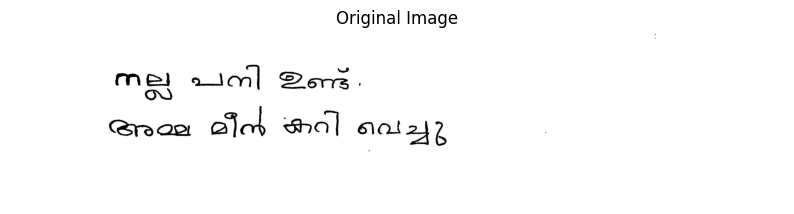

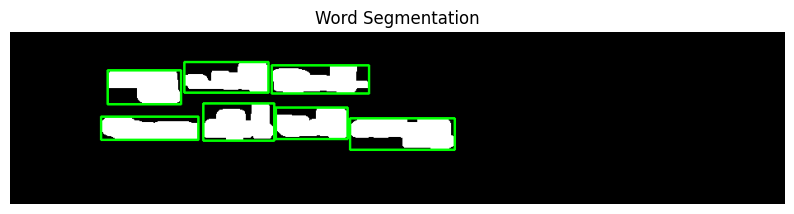

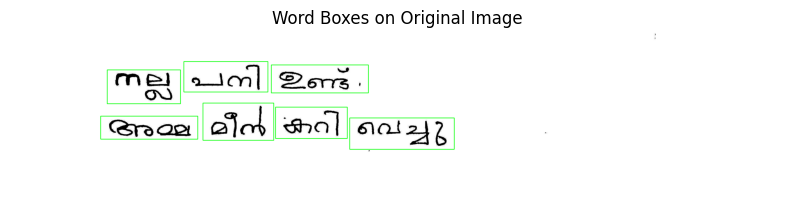

<Figure size 1500x1000 with 0 Axes>

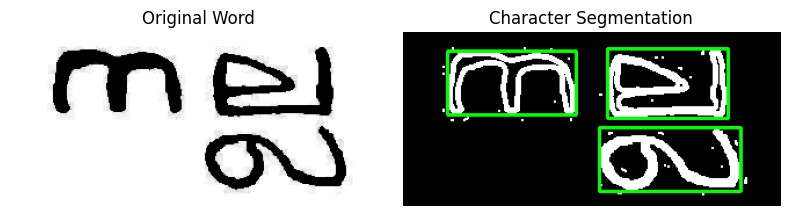

Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_9" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(1, 32, 32, 1), dtype=float32)
  • training=False
  • mask=None
Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_9" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(1, 32, 32, 1), dtype=float32)
  • training=False
  • mask=None
Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_9" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequentia

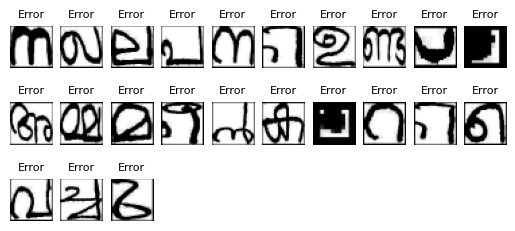

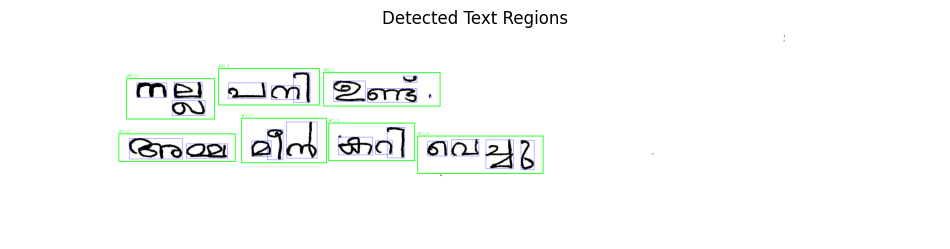

Recognized Text:





In [40]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import os
from matplotlib import pyplot as plt
from scipy import ndimage
from matplotlib import cm as cm

# Load trained model
model = load_model("malayalam_character_recognition.h5")

# Load class dictionary
data_dir = "/content/dataset"
class_names = sorted(os.listdir(data_dir))
class_dict = {idx: class_name for idx, class_name in enumerate(class_names)}

# Function to preprocess image for prediction
def preprocess_image(img):
    img = cv2.resize(img, (32, 32)) / 255.0
    return img.reshape(1, 32, 32, 1)

# Function for character prediction
def predict_character(img):
    img = preprocess_image(img)
    pred = model.predict(img)
    return class_dict[np.argmax(pred)]

# Edge detection functions
def _edge_detect(im):
    # Handle grayscale images
    if len(im.shape) == 2:
        return _sobel_detect(im)
    else:
        return np.max(np.array([_sobel_detect(im[:,:, 0]),
                               _sobel_detect(im[:,:, 1]),
                               _sobel_detect(im[:,:, 2])]), axis=0)

def _sobel_detect(channel):
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def sort_words(boxes):
    # Sort boxes horizontally (by x-coordinate)
    return sorted(boxes, key=lambda box: box[2])

def sort_boxes(boxes):
    if not boxes:
        return []

    # Group boxes by lines based on vertical position and overlap
    boxes_sorted = sorted(boxes, key=lambda box: box[0])  # Sort by top y-coordinate

    lines = []
    current_line = [boxes_sorted[0]]

    for box in boxes_sorted[1:]:
        prev_box = current_line[-1]

        # Check if current box overlaps vertically with previous box
        overlap = min(prev_box[1], box[1]) - max(prev_box[0], box[0])
        overlap_ratio = overlap / min(prev_box[1] - prev_box[0], box[1] - box[0])

        if overlap_ratio > 0.3:  # If significant vertical overlap, add to current line
            current_line.append(box)
        else:
            # Start a new line
            lines.append(sort_words(current_line))
            current_line = [box]

    if current_line:
        lines.append(sort_words(current_line))

    return lines

def padding_resizing_image(img):
    """Add padding and resize image to 32x32 for model input"""
    # Add padding
    padding = 2
    img = cv2.copyMakeBorder(img, padding, padding, padding, padding,
                            cv2.BORDER_CONSTANT, value=0)

    # Resize to 32x32
    try:
        img = cv2.resize(np.uint8(img), (32, 32), interpolation=cv2.INTER_AREA)
        return img
    except Exception as e:
        print(f"Error in resizing: {e}")
        return img

def filter_contours(contours, min_area=100, max_area=None):
    """Filter contours based on area and aspect ratio"""
    filtered_contours = []

    for contour in contours:
        area = cv2.contourArea(contour)
        if area < min_area:
            continue

        if max_area and area > max_area:
            continue

        # Get bounding rectangle
        x, y, w, h = cv2.boundingRect(contour)
        aspect_ratio = w / h if h > 0 else 0

        # Filter extremely elongated contours
        if aspect_ratio > 10 or aspect_ratio < 0.1:
            continue

        filtered_contours.append(contour)

    return filtered_contours

def word_segmentation(img, debug=False):
    """
    Segment the image into words

    Args:
        img: Input image
        debug: Whether to display debug images

    Returns:
        binary_img: Processed binary image
        boxes: List of word bounding boxes [y_min, y_max, x_min, x_max]
    """
    # Make a copy to avoid modifying the original
    img_copy = img.copy()

    # Convert to grayscale if not already
    if len(img_copy.shape) == 3:
        gray = cv2.cvtColor(img_copy, cv2.COLOR_BGR2GRAY)
    else:
        gray = img_copy

    # Resize maintaining aspect ratio
    target_width = 940
    height = int(gray.shape[0] * (target_width / gray.shape[1]))
    resized = cv2.resize(gray, (target_width, height))

    # Apply preprocessing
    blurred = cv2.GaussianBlur(resized, (5, 5), 18)
    edges = _sobel_detect(blurred)

    # Threshold
    _, binary = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morphological operations to connect text components
    kernel = np.ones((15, 5), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    # Dilate to merge characters into words
    kernel = np.ones((3, 15), np.uint8)
    binary = cv2.dilate(binary, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours
    contours = filter_contours(contours, min_area=200)

    # Get bounding boxes [y_min, y_max, x_min, x_max]
    boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)

        # Scale coordinates back to original image
        orig_y = int(y * img.shape[0] / height)
        orig_h = int(h * img.shape[0] / height)
        orig_x = int(x * img.shape[1] / target_width)
        orig_w = int(w * img.shape[1] / target_width)

        boxes.append([orig_y, orig_y + orig_h, orig_x, orig_x + orig_w])

    if debug:
        # Display the binary image and contours
        debug_img = cv2.cvtColor(binary, cv2.COLOR_GRAY2BGR)
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(debug_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

        plt.figure(figsize=(10, 6))
        plt.imshow(debug_img)
        plt.title("Word Segmentation")
        plt.axis('off')
        plt.show()

        # Display original image with boxes
        debug_orig = img.copy()
        for box in boxes:
            cv2.rectangle(debug_orig, (box[2], box[0]), (box[3], box[1]), (0, 255, 0), 2)

        plt.figure(figsize=(10, 6))
        plt.imshow(debug_orig)
        plt.title("Word Boxes on Original Image")
        plt.axis('off')
        plt.show()

    return binary, boxes

def character_segmentation(word_img, debug=False):
    """
    Segment a word image into characters

    Args:
        word_img: Word image (grayscale)
        debug: Whether to display debug images

    Returns:
        char_boxes: List of character bounding boxes relative to word_img [y_min, y_max, x_min, x_max]
    """
    # Ensure image is grayscale
    if len(word_img.shape) == 3:
        word_img = cv2.cvtColor(word_img, cv2.COLOR_BGR2GRAY)

    # Apply adaptive thresholding for better character isolation
    binary = cv2.adaptiveThreshold(word_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                  cv2.THRESH_BINARY_INV, 11, 2)

    # Remove noise
    kernel = np.ones((2, 2), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

    # Find contours - CRITICAL: search only within the word box
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours
    contours = filter_contours(contours, min_area=20, max_area=word_img.shape[0] * word_img.shape[1] * 0.9)

    # Get bounding boxes [y_min, y_max, x_min, x_max]
    char_boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        # Only add if the contour is fully contained within the word box
        char_boxes.append([y, y+h, x, x+w])

    if debug and char_boxes:
        # Display the binary image and character contours
        debug_img = cv2.cvtColor(binary, cv2.COLOR_GRAY2BGR)
        for box in char_boxes:
            cv2.rectangle(debug_img, (box[2], box[0]), (box[3], box[1]), (0, 255, 0), 2)

        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(word_img, cmap='gray')
        plt.title("Original Word")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(debug_img)
        plt.title("Character Segmentation")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

    return char_boxes

def recognize_text(image_path=None):
    """
    Main function to recognize text in an image

    Args:
        image_path: Path to the image file, if None, will prompt user

    Returns:
        output_text: Recognized text
    """
    if image_path is None:
        image_path = input("Enter the path of the image: ")

    if not os.path.exists(image_path):
        print("Invalid path. Please try again.")
        return recognize_text()

    # Load and preprocess image
    original_img = cv2.imread(image_path)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Display original image
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')
    plt.show()

    # Preprocess image
    kernel = np.ones((3, 3), np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    # Word segmentation with debug=True to show the result
    _, word_boxes = word_segmentation(img, debug=True)

    if not word_boxes:
        print("No text detected in the image.")
        return ""

    # Sort word boxes
    word_boxes = sort_boxes(word_boxes)

    # Create output visualization
    output_img = original_img.copy()

    # Create a figure to display the segmented characters
    plt.figure(figsize=(15, 10))
    plt.suptitle("Segmented Characters", fontsize=16)

    max_chars_display = 50
    plot_idx = 1
    chars_displayed = 0

    output_text = ""

    # Process each line
    for line_idx, line in enumerate(word_boxes):
        line_text = ""

        # Process each word in the line
        for word_idx, word_box in enumerate(line):
            # Get word coordinates
            y_min, y_max, x_min, x_max = word_box

            # Extract the word region
            word_img = img[y_min:y_max, x_min:x_max]

            # Skip if empty word region
            if word_img.size == 0 or word_img.shape[0] < 5 or word_img.shape[1] < 5:
                continue

            # Convert to grayscale if needed
            if len(word_img.shape) == 3:
                word_img_gray = cv2.cvtColor(word_img, cv2.COLOR_RGB2GRAY)
            else:
                word_img_gray = word_img

            # Draw rectangle around the word
            cv2.rectangle(output_img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            cv2.putText(output_img, f"W{line_idx}_{word_idx}", (x_min, y_min-5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

            # Character segmentation - only within this word box
            char_boxes = character_segmentation(word_img_gray, debug=(word_idx == 0 and line_idx == 0))

            word_text = ""

            # Sort characters from left to right
            char_boxes = sorted(char_boxes, key=lambda box: box[2])

            # Process each character
            for char_idx, char_box in enumerate(char_boxes):
                if chars_displayed >= max_chars_display:
                    break

                # Extract character image from within the word
                char_y_min, char_y_max, char_x_min, char_x_max = char_box

                # Skip if character box extends outside the word box
                if (char_y_max > word_img_gray.shape[0] or
                    char_x_max > word_img_gray.shape[1]):
                    continue

                char_img = word_img_gray[char_y_min:char_y_max, char_x_min:char_x_max]

                # Skip if character image is too small
                if char_img.shape[0] < 5 or char_img.shape[1] < 5:
                    continue

                # Process character image for model input
                processed_char_img = padding_resizing_image(char_img)

                # Display the character
                if plot_idx <= max_chars_display:
                    plt.subplot(5, 10, plot_idx)
                    plt.imshow(processed_char_img, cmap='gray')
                    plt.axis('off')

                    # Draw rectangle on output image for the character
                    abs_char_x_min = x_min + char_x_min
                    abs_char_y_min = y_min + char_y_min
                    abs_char_x_max = x_min + char_x_max
                    abs_char_y_max = y_min + char_y_max

                    cv2.rectangle(output_img,
                                 (abs_char_x_min, abs_char_y_min),
                                 (abs_char_x_max, abs_char_y_max),
                                 (255, 0, 0), 1)

                    # Try to predict the character
                    try:
                        pred_char = predict_character(processed_char_img)
                        plt.title(f"{pred_char}", fontsize=8)
                        word_text += pred_char
                    except Exception as e:
                        plt.title("Error", fontsize=8)
                        print(f"Error predicting character: {e}")

                    plot_idx += 1
                    chars_displayed += 1

            line_text += word_text + " "

        output_text += line_text.strip() + "\n"

    # Display the output image with bounding boxes
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    plt.title("Detected Text Regions")
    plt.axis('off')
    plt.show()

    print("Recognized Text:")
    print(output_text)

    return output_text

# Run text recognition if script is executed directly
if __name__ == "__main__":
    recognize_text()


Loading model from malayalam_character_recognition.h5
Model loaded successfully
Loaded 48 character classes
Processing image: /content/pic2.jpeg


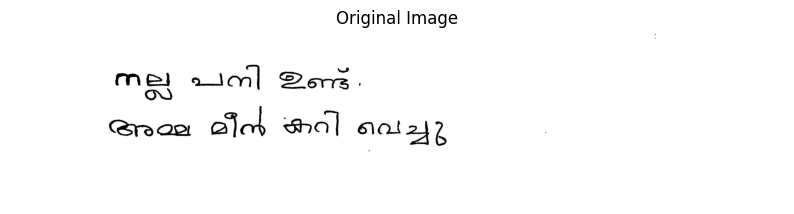

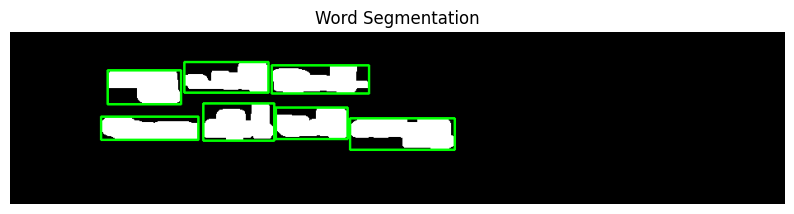

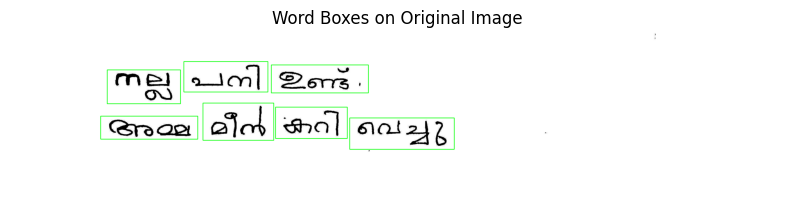

<Figure size 1500x1000 with 0 Axes>

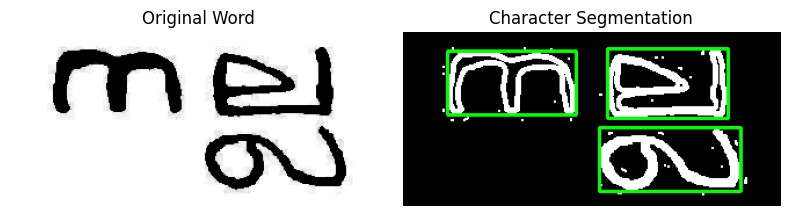

Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_7" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(1, 32, 32, 1), dtype=float32)
  • training=False
  • mask=None
Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_7" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(1, 32, 32, 1), dtype=float32)
  • training=False
  • mask=None
Error predicting character: Exception encountered when calling Sequential.call().

Input 0 of layer "dense_7" is incompatible with the layer: expected axis -1 of input shape to have value 4608, but received input with shape (1, 2048)

Arguments received by Sequentia

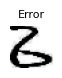

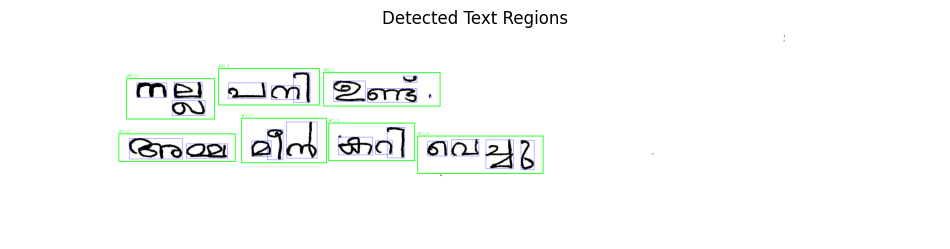

Recognized Text:




Final result: 




In [35]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import os
from matplotlib import pyplot as plt
from scipy import ndimage
from matplotlib import cm as cm

# Path to your trained model and image for recognition
MODEL_PATH = "malayalam_character_recognition.h5"
IMAGE_PATH = "sample_malayalam_text.jpg"  # Replace with your image path
DATA_DIR = "dataset"  # Directory containing your character classes

# Load trained model
def load_recognition_model(model_path):
    print(f"Loading model from {model_path}")
    try:
        model = load_model(model_path)
        print("Model loaded successfully")
        return model
    except Exception as e:
        print(f"Error loading model: {e}")
        return None

# Load class dictionary
def load_class_dictionary(data_dir):
    if os.path.exists(data_dir):
        class_names = sorted(os.listdir(data_dir))
        class_dict = {idx: class_name for idx, class_name in enumerate(class_names)}
        print(f"Loaded {len(class_dict)} character classes")
        return class_dict
    else:
        print(f"Data directory {data_dir} not found. Using placeholder class dictionary.")
        # Create a placeholder dictionary with Malayalam characters from the original code
        alphabets = ['്', 'ാ', 'ി', 'ീ', 'ു', 'ൂ', 'െ', 'ൃ', 'െ', 'ൌ', 'ം', 'അ', 'ആ', 'ഇ', 'ഉ', 'ഋ', 'എ', 'ഏ', 'ഒ', 'ക', 'ഖ', 'ഗ', 'ഘ', 'ങ', 'ച', 'ഛ', 'ജ', 'ഝ', 'ഞ', 'ട', 'ഠ', 'ഡ', 'ഢ', 'ണ', 'ത', 'ഫ', 'ദ', 'ധ', 'ന', 'പ', 'ഫ', 'ബ', 'ഭ', 'മ', 'യ', 'ര',
                     'റ', 'ല', 'ള', 'ഴ', 'വ', 'ശ', 'ഷ', 'സ', 'ഹ', 'ൺ', 'ൻ', 'ർ', 'ൽ', 'ൾ', 'ക്ക', 'ക്ഷ', 'ങ്ക', 'ങ്ങ', 'ച്ച', 'ഞ്ച', 'ഞ്ഞ', 'ട്ട', 'ണ്ട', 'ണ്ണ', 'ത്ത', 'ദ്ധ', 'ന്ത', 'ന്ദ', 'ന്ന', 'പ്പ', 'മ്പ', 'മ്മ', 'യ്യ', 'ല്ല', 'ള്ള', 'വ്വ', '്യ', '്ര', '്വ']
        return {idx: char for idx, char in enumerate(alphabets)}

# Update the preprocess_image function to match the model's expected input shape
def preprocess_image(img):
    # First ensure we're working with the right dimensions
    # Convert to grayscale if it's not already
    if len(img.shape) == 3 and img.shape[2] > 1:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Resize to the dimensions expected by the model (32x32)
    img = cv2.resize(img, (32, 32))

    # Normalize pixel values to [0,1]
    img = img.astype('float32') / 255.0

    # Reshape to match the model's expected input
    # Try with a different shape - instead of (1, 32, 32, 1)
    return img.reshape(1, 32, 32, 1)

# Function for character prediction
def predict_character(model, class_dict, img):
    img = preprocess_image(img)
    pred = model.predict(img)
    return class_dict[np.argmax(pred)]

# Main function to run the entire recognition pipeline
def run_malayalam_ocr(image_path, model_path=MODEL_PATH, data_dir=DATA_DIR, debug=True):
    # Load model and class dictionary
    model = load_recognition_model(model_path)
    if model is None:
        return "Error: Could not load model"

    class_dict = load_class_dictionary(data_dir)

    # Check if image exists
    if not os.path.exists(image_path):
        return f"Error: Image not found at {image_path}"

    # Load and display the image
    print(f"Processing image: {image_path}")
    original_img = cv2.imread(image_path)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    if debug:
        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.title("Original Image")
        plt.axis('off')
        plt.show()

    # Preprocess image
    kernel = np.ones((3, 3), np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    # Word segmentation
    _, word_boxes = word_segmentation(img, debug=debug)

    if not word_boxes:
        return "No text detected in the image."

    # Sort word boxes
    word_boxes = sort_boxes(word_boxes)

    # Create output visualization
    output_img = original_img.copy()

    if debug:
        # Create a figure to display the segmented characters
        plt.figure(figsize=(15, 10))
        plt.suptitle("Segmented Characters", fontsize=16)

    max_chars_display = 50
    plot_idx = 1
    chars_displayed = 0

    output_text = ""

    # Process each line
    for line_idx, line in enumerate(word_boxes):
        line_text = ""

        # Process each word in the line
        for word_idx, word_box in enumerate(line):
            # Get word coordinates
            y_min, y_max, x_min, x_max = word_box

            # Extract the word region
            word_img = img[y_min:y_max, x_min:x_max]

            # Skip if empty word region
            if word_img.size == 0 or word_img.shape[0] < 5 or word_img.shape[1] < 5:
                continue

            # Convert to grayscale if needed
            if len(word_img.shape) == 3:
                word_img_gray = cv2.cvtColor(word_img, cv2.COLOR_RGB2GRAY)
            else:
                word_img_gray = word_img

            # Draw rectangle around the word
            cv2.rectangle(output_img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            cv2.putText(output_img, f"W{line_idx}_{word_idx}", (x_min, y_min-5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

            # Character segmentation - only within this word box
            char_boxes = character_segmentation(word_img_gray, debug=(word_idx == 0 and line_idx == 0 and debug))

            word_text = ""

            # Sort characters from left to right
            char_boxes = sorted(char_boxes, key=lambda box: box[2])

            # Process each character
            for char_idx, char_box in enumerate(char_boxes):
                if chars_displayed >= max_chars_display and debug:
                    break

                # Extract character image from within the word
                char_y_min, char_y_max, char_x_min, char_x_max = char_box

                # Skip if character box extends outside the word box
                if (char_y_max > word_img_gray.shape[0] or
                    char_x_max > word_img_gray.shape[1]):
                    continue

                char_img = word_img_gray[char_y_min:char_y_max, char_x_min:char_x_max]

                # Skip if character image is too small
                if char_img.shape[0] < 5 or char_img.shape[1] < 5:
                    continue

                # Process character image for model input
                processed_char_img = padding_resizing_image(char_img)

                # Display the character
                if debug and plot_idx <= max_chars_display:
                    plt.subplot(5, 10, plot_idx)
                    plt.imshow(processed_char_img, cmap='gray')
                    plt.axis('off')

                    # Draw rectangle on output image for the character
                    abs_char_x_min = x_min + char_x_min
                    abs_char_y_min = y_min + char_y_min
                    abs_char_x_max = x_min + char_x_max
                    abs_char_y_max = y_min + char_y_max

                    cv2.rectangle(output_img,
                                 (abs_char_x_min, abs_char_y_min),
                                 (abs_char_x_max, abs_char_y_max),
                                 (255, 0, 0), 1)

                # Try to predict the character
                try:
                    pred_char = predict_character(model, class_dict, processed_char_img)
                    if debug and plot_idx <= max_chars_display:
                        plt.title(f"{pred_char}", fontsize=8)
                    word_text += pred_char
                    plot_idx += 1
                    chars_displayed += 1
                except Exception as e:
                    if debug and plot_idx <= max_chars_display:
                        plt.title("Error", fontsize=8)
                    print(f"Error predicting character: {e}")

            line_text += word_text + " "

        output_text += line_text.strip() + "\n"

    if debug:
        # Display the output image with bounding boxes
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
        plt.title("Detected Text Regions")
        plt.axis('off')
        plt.show()

    print("Recognized Text:")
    print(output_text)

    return output_text

# Include all the original helper functions
def _edge_detect(im):
    # Handle grayscale images
    if len(im.shape) == 2:
        return _sobel_detect(im)
    else:
        return np.max(np.array([_sobel_detect(im[:,:, 0]),
                               _sobel_detect(im[:,:, 1]),
                               _sobel_detect(im[:,:, 2])]), axis=0)

def _sobel_detect(channel):
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def sort_words(boxes):
    # Sort boxes horizontally (by x-coordinate)
    return sorted(boxes, key=lambda box: box[2])

def sort_boxes(boxes):
    if not boxes:
        return []

    # Group boxes by lines based on vertical position and overlap
    boxes_sorted = sorted(boxes, key=lambda box: box[0])  # Sort by top y-coordinate

    lines = []
    current_line = [boxes_sorted[0]]

    for box in boxes_sorted[1:]:
        prev_box = current_line[-1]

        # Check if current box overlaps vertically with previous box
        overlap = min(prev_box[1], box[1]) - max(prev_box[0], box[0])
        overlap_ratio = overlap / min(prev_box[1] - prev_box[0], box[1] - box[0])

        if overlap_ratio > 0.3:  # If significant vertical overlap, add to current line
            current_line.append(box)
        else:
            # Start a new line
            lines.append(sort_words(current_line))
            current_line = [box]

    if current_line:
        lines.append(sort_words(current_line))

    return lines

def padding_resizing_image(img):
    """Add padding and resize image to 32x32 for model input"""
    # Add padding
    padding = 2
    img = cv2.copyMakeBorder(img, padding, padding, padding, padding,
                            cv2.BORDER_CONSTANT, value=0)

    # Resize to 32x32
    try:
        img = cv2.resize(np.uint8(img), (32, 32), interpolation=cv2.INTER_AREA)
        return img
    except Exception as e:
        print(f"Error in resizing: {e}")
        return img

def filter_contours(contours, min_area=100, max_area=None):
    """Filter contours based on area and aspect ratio"""
    filtered_contours = []

    for contour in contours:
        area = cv2.contourArea(contour)
        if area < min_area:
            continue

        if max_area and area > max_area:
            continue

        # Get bounding rectangle
        x, y, w, h = cv2.boundingRect(contour)
        aspect_ratio = w / h if h > 0 else 0

        # Filter extremely elongated contours
        if aspect_ratio > 10 or aspect_ratio < 0.1:
            continue

        filtered_contours.append(contour)

    return filtered_contours

def word_segmentation(img, debug=False):
    """
    Segment the image into words

    Args:
        img: Input image
        debug: Whether to display debug images

    Returns:
        binary_img: Processed binary image
        boxes: List of word bounding boxes [y_min, y_max, x_min, x_max]
    """
    # Make a copy to avoid modifying the original
    img_copy = img.copy()

    # Convert to grayscale if not already
    if len(img_copy.shape) == 3:
        gray = cv2.cvtColor(img_copy, cv2.COLOR_BGR2GRAY)
    else:
        gray = img_copy

    # Resize maintaining aspect ratio
    target_width = 940
    height = int(gray.shape[0] * (target_width / gray.shape[1]))
    resized = cv2.resize(gray, (target_width, height))

    # Apply preprocessing
    blurred = cv2.GaussianBlur(resized, (5, 5), 18)
    edges = _sobel_detect(blurred)

    # Threshold
    _, binary = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morphological operations to connect text components
    kernel = np.ones((15, 5), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    # Dilate to merge characters into words
    kernel = np.ones((3, 15), np.uint8)
    binary = cv2.dilate(binary, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours
    contours = filter_contours(contours, min_area=200)

    # Get bounding boxes [y_min, y_max, x_min, x_max]
    boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)

        # Scale coordinates back to original image
        orig_y = int(y * img.shape[0] / height)
        orig_h = int(h * img.shape[0] / height)
        orig_x = int(x * img.shape[1] / target_width)
        orig_w = int(w * img.shape[1] / target_width)

        boxes.append([orig_y, orig_y + orig_h, orig_x, orig_x + orig_w])

    if debug:
        # Display the binary image and contours
        debug_img = cv2.cvtColor(binary, cv2.COLOR_GRAY2BGR)
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(debug_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

        plt.figure(figsize=(10, 6))
        plt.imshow(debug_img)
        plt.title("Word Segmentation")
        plt.axis('off')
        plt.show()

        # Display original image with boxes
        debug_orig = img.copy()
        for box in boxes:
            cv2.rectangle(debug_orig, (box[2], box[0]), (box[3], box[1]), (0, 255, 0), 2)

        plt.figure(figsize=(10, 6))
        plt.imshow(debug_orig)
        plt.title("Word Boxes on Original Image")
        plt.axis('off')
        plt.show()

    return binary, boxes

def character_segmentation(word_img, debug=False):
    """
    Segment a word image into characters

    Args:
        word_img: Word image (grayscale)
        debug: Whether to display debug images

    Returns:
        char_boxes: List of character bounding boxes relative to word_img [y_min, y_max, x_min, x_max]
    """
    # Ensure image is grayscale
    if len(word_img.shape) == 3:
        word_img = cv2.cvtColor(word_img, cv2.COLOR_BGR2GRAY)

    # Apply adaptive thresholding for better character isolation
    binary = cv2.adaptiveThreshold(word_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                  cv2.THRESH_BINARY_INV, 11, 2)

    # Remove noise
    kernel = np.ones((2, 2), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

    # Find contours - CRITICAL: search only within the word box
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours
    contours = filter_contours(contours, min_area=20, max_area=word_img.shape[0] * word_img.shape[1] * 0.9)

    # Get bounding boxes [y_min, y_max, x_min, x_max]
    char_boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        # Only add if the contour is fully contained within the word box
        char_boxes.append([y, y+h, x, x+w])

    if debug and char_boxes:
        # Display the binary image and character contours
        debug_img = cv2.cvtColor(binary, cv2.COLOR_GRAY2BGR)
        for box in char_boxes:
            cv2.rectangle(debug_img, (box[2], box[0]), (box[3], box[1]), (0, 255, 0), 2)

        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(word_img, cmap='gray')
        plt.title("Original Word")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(debug_img)
        plt.title("Character Segmentation")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

    return char_boxes

# Fixed function for character prediction that directly uses the model
def predict_character(model, class_dict, img, confidence_threshold=0.5):
    """
    Predict character using the trained model.

    Args:
        model: Loaded TensorFlow model
        class_dict: Dictionary mapping class indices to character names
        img: Input image
        confidence_threshold: Minimum confidence threshold for prediction

    Returns:
        Tuple of (predicted character, confidence)
    """
    # Convert to grayscale if it's not already
    if len(img.shape) == 3 and img.shape[2] > 1:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Resize to the dimensions expected by the model (32x32)
    img = cv2.resize(img, (32, 32))

    # Normalize pixel values to [0,1]
    img = img.astype('float32') / 255.0

    # Reshape to match the model's expected input
    img = img.reshape(1, 32, 32, 1)

    # Make prediction using the model
    pred_probs = model.predict(img, verbose=0)[0]
    max_prob = np.max(pred_probs)
    pred_class = np.argmax(pred_probs)

    # Only return a prediction if confidence is above threshold
    if max_prob >= confidence_threshold:
        return class_dict[pred_class], max_prob
    else:
        return None, max_prob

# Update the main OCR function to ensure model is properly used
def run_malayalam_ocr(image_path, model_path=MODEL_PATH, data_dir=DATA_DIR, debug=True, confidence_threshold=0.5):
    # Load model and class dictionary
    model = load_recognition_model(model_path)
    if model is None:
        return "Error: Could not load model"

    class_dict = load_class_dictionary(data_dir)

    # Check if image exists
    if not os.path.exists(image_path):
        return f"Error: Image not found at {image_path}"

    # Load and display the image
    print(f"Processing image: {image_path}")
    original_img = cv2.imread(image_path)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    if debug:
        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.title("Original Image")
        plt.axis('off')
        plt.show()

    # Preprocess image for word segmentation
    kernel = np.ones((3, 3), np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    # Word segmentation
    _, word_boxes = word_segmentation(img, debug=debug)

    if not word_boxes:
        return "No text detected in the image."

    # Sort word boxes
    word_boxes = sort_boxes(word_boxes)

    # Create output visualization
    output_img = original_img.copy()

    if debug:
        # Create a figure to display the segmented characters
        plt.figure(figsize=(15, 10))
        plt.suptitle("Segmented Characters", fontsize=16)

    max_chars_display = 50
    plot_idx = 1
    chars_displayed = 0

    output_text = ""

    # Process each line
    for line_idx, line in enumerate(word_boxes):
        line_text = ""

        # Process each word in the line
        for word_idx, word_box in enumerate(line):
            # Get word coordinates
            y_min, y_max, x_min, x_max = word_box

            # Extract the word region
            word_img = img[y_min:y_max, x_min:x_max]

            # Skip if empty word region
            if word_img.size == 0 or word_img.shape[0] < 5 or word_img.shape[1] < 5:
                continue

            # Convert to grayscale if needed
            if len(word_img.shape) == 3:
                word_img_gray = cv2.cvtColor(word_img, cv2.COLOR_RGB2GRAY)
            else:
                word_img_gray = word_img

            # Draw rectangle around the word
            cv2.rectangle(output_img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            cv2.putText(output_img, f"W{line_idx}_{word_idx}", (x_min, y_min-5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

            # Character segmentation - only within this word box
            char_boxes = character_segmentation(word_img_gray, debug=(word_idx == 0 and line_idx == 0 and debug))

            word_text = ""

            # Sort characters from left to right
            char_boxes = sorted(char_boxes, key=lambda box: box[2])

            # Process each character
            for char_idx, char_box in enumerate(char_boxes):
                if chars_displayed >= max_chars_display and debug:
                    break

                # Extract character image from within the word
                char_y_min, char_y_max, char_x_min, char_x_max = char_box

                # Skip if character box extends outside the word box
                if (char_y_max > word_img_gray.shape[0] or
                    char_x_max > word_img_gray.shape[1]):
                    continue

                char_img = word_img_gray[char_y_min:char_y_max, char_x_min:char_x_max]

                # Skip if character image is too small
                if char_img.shape[0] < 5 or char_img.shape[1] < 5:
                    continue

                # Prepare character image for model prediction
                # This is the critical part: we're directly passing the char_img to the model

                # Display the character
                if debug and plot_idx <= max_chars_display:
                    plt.subplot(5, 10, plot_idx)
                    # Show the character as it will be seen by the model (after resizing to 32x32)
                    display_img = cv2.resize(char_img, (32, 32))
                    plt.imshow(display_img, cmap='gray')
                    plt.axis('off')

                    # Draw rectangle on output image for the character
                    abs_char_x_min = x_min + char_x_min
                    abs_char_y_min = y_min + char_y_min
                    abs_char_x_max = x_min + char_x_max
                    abs_char_y_max = y_min + char_y_max

                    cv2.rectangle(output_img,
                                 (abs_char_x_min, abs_char_y_min),
                                 (abs_char_x_max, abs_char_y_max),
                                 (255, 0, 0), 1)

                # Try to predict the character with the model
                try:
                    # Direct prediction using the model
                    pred_char, confidence = predict_character(model, class_dict, char_img, confidence_threshold)

                    if pred_char is not None:
                        if debug and plot_idx <= max_chars_display:
                            plt.title(f"{pred_char} ({confidence:.2f})", fontsize=8)
                        word_text += pred_char
                    else:
                        if debug and plot_idx <= max_chars_display:
                            plt.title(f"Low conf: {confidence:.2f}", fontsize=8)

                    plot_idx += 1
                    chars_displayed += 1
                except Exception as e:
                    if debug and plot_idx <= max_chars_display:
                        plt.title("Error", fontsize=8)
                    print(f"Error predicting character: {e}")

            line_text += word_text + " "

        output_text += line_text.strip() + "\n"

    if debug:
        # Display the output image with bounding boxes
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
        plt.title("Detected Text Regions")
        plt.axis('off')
        plt.show()

    print("Recognized Text:")
    print(output_text)

    return output_text

# Example usage
if __name__ == "__main__":
    # Replace with your actual image path
    result = run_malayalam_ocr("/content/pic2.jpeg", confidence_threshold=0.6)
    print("\nFinal result:", result)

In [ ]:
!pip install fastai==1.0.61
!pip install torch==1.13.0 torchvision==0.8.2


Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.
For demo purposes, the character prediction will return a placeholder if models are not found.


Saving pic3.jpeg to pic3.jpeg
Predicting character from: output/png/pic3/17_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/12_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/6_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/0_5.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/12_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/7_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/4_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/15_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/14_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/15_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/14_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/9_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/13_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/5_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/5_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/9_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/14_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/11_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/20_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/19_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/0_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/18_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/10_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/3_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/8_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/15_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/6_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/8_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/16_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/0_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/11_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/18_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/8_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/18_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/12_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/13_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/4_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/19_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/17_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/10_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/20_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/9_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/19_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/7_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/15_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/7_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/0_4.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/16_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3/20_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

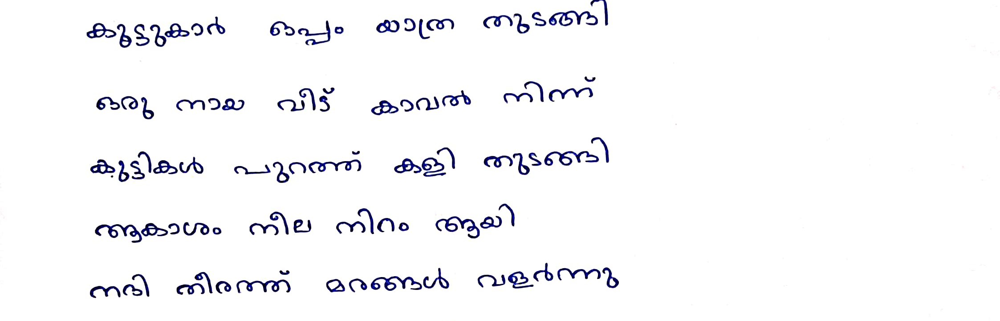

'ംുടങ്കാർ ഘ ംീത നുഞ്ഞി അ്ര നഫ ഹ്വ ംബർ നിന്ന ംഫഏ പഞ്ഞ ംി ത്തങ്ങി ഞ്ഞശ നില നിറ് ഝി ന്നി ന്നറന്ന ംറഞ്ഞ മ്പർത്ത '

In [47]:
# Install required packages

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy import ndimage
import torch
from fastai.vision import *
from fastai.metrics import accuracy
import json
from google.colab import files
from IPython.display import display, HTML, Image
from PIL import Image as PILImage

# Create necessary directories
for folder in ['uploads', 'output/png', 'output/png_x64', 'output/svg']:
    os.makedirs(folder, exist_ok=True)

def predict_alphabets(image_path):
    """Predict Malayalam character from image using pre-trained model"""
    print(f"Predicting character from: {image_path}")
    defaults.device = torch.device("cpu")

    # Malayalam alphabets mapping
    alphabets = ['്', 'ാ', 'ി', 'ീ', 'ു', 'ൂ', 'െ', 'ൃ', 'െ', 'ൌ', 'ം', 'അ', 'ആ', 'ഇ', 'ഉ', 'ഋ', 'എ', 'ഏ', 'ഒ', 'ക', 'ഖ', 'ഗ', 'ഘ', 'ങ', 'ച', 'ഛ', 'ജ', 'ഝ', 'ഞ', 'ട', 'ഠ', 'ഡ', 'ഢ', 'ണ', 'ത', 'ഫ', 'ദ', 'ധ', 'ന', 'പ', 'ഫ', 'ബ', 'ഭ', 'മ', 'യ', 'ര',
                 'റ', 'ല', 'ള', 'ഴ', 'വ', 'ശ', 'ഷ', 'സ', 'ഹ', 'ൺ', 'ൻ', 'ർ', 'ൽ', 'ൾ', 'ക്ക', 'ക്ഷ', 'ങ്ക', 'ങ്ങ', 'ച്ച', 'ഞ്ച', 'ഞ്ഞ', 'ട്ട', 'ണ്ട', 'ണ്ണ', 'ത്ത', 'ദ്ധ', 'ന്ത', 'ന്ദ', 'ന്ന', 'പ്പ', 'മ്പ', 'മ്മ', 'യ്യ', 'ല്ല', 'ള്ള', 'വ്വ', '്യ', '്ര', '്വ']

    # Label mapping (you'll need to download or train these models)
    labels = {'12': 20, '54': 59, '79': 81, '26': 33, '83': 85, '11': 2, '18': 26, '55': 6, '42': 48, '14': 22, '36': 42, '63': 67, '57': 61, '60': 64, '70': 73, '31': 38, '65': 69, '0': 1, '73': 76, '51': 56, '17': 25, '84': 9, '1': 10, '64': 68, '38': 44, '47': 52, '23': 30, '68': 71, '80': 82, '75': 78, '30': 37, '72': 75, '82': 84, '43': 49, '62': 66, '49': 54, '77': 8, '5': 14, '34': 40, '16': 24, '25': 32, '29': 36,
              '39': 45, '21': 29, '74': 77, '46': 51, '44': 5, '27': 34, '35': 41, '37': 43, '58': 62, '9': 18, '4': 13, '41': 47, '40': 46, '81': 83, '67': 70, '59': 63, '69': 72, '52': 57, '78': 80, '15': 23, '33': 4, '24': 31, '22': 3, '76': 79, '10': 19, '3': 12, '50': 55, '28': 35, '6': 15, '19': 27, '2': 11, '7': 16, '53': 58, '32': 39, '61': 65, '8': 17, '13': 21, '45': 50, '71': 74, '44': 5, '48': 53, '56': 60, '20': 28, '66': 7}

    # For demo purposes, we'll need to download the model files first
    # !wget https://example.com/alexnet_non_pretrained_bs32.pkl
    # !wget https://example.com/resnet_18_non-pre_trained.pkl

    # Ensemble models
    ens = ["/content/alexnet_non_pretrained_bs32.pkl", "/content/resnet_18_non-pre_trained.pkl"]
    ens_test_preds = []

    # If models don't exist, return a placeholder
    if not all(os.path.exists(mod) for mod in ens):
        print("Warning: Model files not found. Please download the model files first.")
        return "അ"  # Return a placeholder character

    for mod in ens:
        learn = load_learner(path='.', file=mod)
        img = open_image(image_path)
        pred_class, pred_idx, outputs = learn.predict(img)
        ens_test_preds.append(np.array(outputs))

    ens_preds = np.mean(ens_test_preds, axis=0)
    predicted_char = alphabets[int(labels[str(np.argmax(ens_preds))]) - 1]
    return predicted_char

def _edge_detect(im):
    """Detect edges in image using Sobel operator"""
    return np.max(np.array([_sobel_detect(im[:, :, 0]),
                           _sobel_detect(im[:, :, 1]),
                           _sobel_detect(im[:, :, 2])]), axis=0)

def _sobel_detect(channel):
    """Apply Sobel edge detection to an image channel"""
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def sort_words(boxes):
    """Sort word boxes horizontally"""
    for i in range(1, len(boxes)):
        key = boxes[i]
        j = i - 1
        while j >= 0 and key[2] < boxes[j][2]:
            boxes[j+1] = boxes[j]
            j -= 1
        boxes[j+1] = key
    return boxes

def sort_boxes(boxes):
    """Sort boxes into lines and then words"""
    lines = []
    new_lines = []
    tmp_box = boxes[0]
    lines.append(tmp_box)

    for box in boxes[1:]:
        if (box[0] + (box[1] - box[0])/2) < tmp_box[1]:
            lines.append(box)
            tmp_box = box
        else:
            new_lines.append(sort_words(lines))
            lines = []
            tmp_box = box
            lines.append(box)

    new_lines.append(sort_words(lines))
    return new_lines

def sort_labels(label_boxes):
    """Sort label boxes horizontally"""
    for i in range(1, len(label_boxes)):
        key = label_boxes[i]
        j = i - 1
        while j >= 0 and key[1][2] < label_boxes[j][1][2]:
            label_boxes[j+1] = label_boxes[j]
            j -= 1
        label_boxes[j+1] = key
    return label_boxes

def scale_boxes(new_img, old_img, coords):
    """Scale coordinates from one image size to another"""
    coords[0] = int((coords[0]) * new_img.shape[0] / old_img.shape[0])  # new top left
    coords[1] = int((coords[1]) * new_img.shape[1] / old_img.shape[1])  # new bottom left
    coords[2] = int((coords[2] + 1) * new_img.shape[0] / old_img.shape[0]) - 1  # new top right
    coords[3] = int((coords[3] + 1) * new_img.shape[1] / old_img.shape[1]) - 1  # new bottom right
    return coords

def clipping_image(new):
    """Clip image to content boundaries"""
    colsums = np.sum(new, axis=0)
    linessum = np.sum(new, axis=1)
    colsums2 = np.nonzero(0-colsums)
    linessum2 = np.nonzero(0-linessum)

    if linessum2[0].size == 0 or colsums2[0].size == 0:
        return new, [0, new.shape[0], 0, new.shape[1]]

    x = linessum2[0][0]  # top left
    xh = linessum2[0][linessum2[0].shape[0]-1]  # bottom left
    y = colsums2[0][0]  # top right
    yw = colsums2[0][colsums2[0].shape[0]-1]  # bottom right

    imgcrop = new[x:xh, y:yw]  # crop the image

    return imgcrop, [x, xh, y, yw]

def padding_resizing_image(img, reduce_size):
    """Add padding and resize image"""
    # Add padding to image
    img = cv2.copyMakeBorder(img, 2, 2, 0, 0, cv2.BORDER_CONSTANT)
    try:
        # Resize the image to specified size
        img = cv2.resize(np.uint8(img), (reduce_size, reduce_size))
    except Exception as e:
        print(f"Error resizing image: {e}")
    return img

def segmentation(img, sequence, origimg=None, wordNo=None, filename=None):
    """Segment image into words or characters"""
    if sequence == "word":  # resize to find the words
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 18
    elif sequence == "character":  # resize to find the characters
        width = img.shape[1]
        height = img.shape[0]
        sigma = 0

    img = cv2.resize(img, (width, height))
    blurred = cv2.GaussianBlur(img, (5, 5), sigma)  # apply gaussian blur

    if sequence == "word":
        blurred = _edge_detect(blurred)  # edge detect in blurred image (words)
        # Otsu's thresholding with Binary
        ret, img = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        # Morphological processing - Black&White
        img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, np.ones((15, 15), np.uint8))

    elif sequence == "character":
        # Otsu's thresholding with Binary Inverted
        ret, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

    num_labels, labels_im = cv2.connectedComponents(img)  # find connected components

    if sequence == "word":
        boxes = []  # for storing the coordinates of the bounding boxes
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)
            if not (new.shape[0] < 10 or new.shape[1] < 10):
                boxes.append(new_coord)
        return img, boxes

    if sequence == "character":
        boxes = []
        label_box = []
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)
            if not (new.shape[0] < 10 or new.shape[1] < 10):
                label_box.append([i, new_coord])

        label_box = sort_labels(label_box)  # sort the words
        chNo = 0

        # Create output directory if it doesn't exist
        os.makedirs(os.path.join('output/png', filename), exist_ok=True)
        os.makedirs(os.path.join('output/png_x64', filename), exist_ok=True)

        for box in label_box:
            ch_img, nr_objects = ndimage.label(labels_im == box[0])
            ch_img, new_coord = clipping_image(ch_img)
            cropped_image = padding_resizing_image(ch_img, 32)
            cropped_image_x64 = padding_resizing_image(ch_img, 64)

            try:
                dst = os.path.join('output/png', filename, f"{wordNo}_{chNo}.png")
                dst_x64 = os.path.join('output/png_x64', filename, f"{wordNo}_{chNo}.png")
                plt.imsave(dst, cropped_image, cmap=cm.gray)
                plt.imsave(dst_x64, cropped_image_x64, cmap=cm.gray)
            except Exception as e:
                print(f"Error saving segmented character: {e}")

            chNo += 1

        return img, boxes

def img_to_seg(img, filename):
    """Segment image into words and characters"""
    # Change image width to 1280px
    img = cv2.resize(img, (1280, int(img.shape[0] * (1280 / img.shape[1]))))
    kernel = np.ones((5, 5), np.uint8)  # kernel for opening
    # Opening image to remove minor noise
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    new_img, boxes = segmentation(img, "word")  # line segmentation
    if not boxes:
        return "0", 0

    boxes.sort()
    boxes = sort_boxes(boxes)
    scaled_boxes = []  # coordinates values scaled to img

    for box_line in boxes:
        for box in box_line:
            box = scale_boxes(img, new_img, box)
            scaled_boxes.append(box)

    wordNo = 0
    for scaled_box in scaled_boxes:
        # Check if the coordinates are valid
        if scaled_box[0] >= scaled_box[1] or scaled_box[2] >= scaled_box[3]:
            continue
        if scaled_box[0] < 0 or scaled_box[2] < 0 or scaled_box[1] >= img.shape[0] or scaled_box[3] >= img.shape[1]:
            continue

        img_gray = cv2.cvtColor(img[scaled_box[0]:scaled_box[1], scaled_box[2]:scaled_box[3]], cv2.COLOR_BGR2GRAY)
        img_new, _ = segmentation(img_gray, "character", None, wordNo, filename)
        wordNo += 1

    return "1", wordNo

# Function to process the uploaded image
def process_image(img_path):
    """Process the uploaded image and recognize text"""
    filename = os.path.basename(img_path)
    base_filename = os.path.splitext(filename)[0]

    # Create output directories
    for subdir in ['png', 'png_x64', 'svg']:
        os.makedirs(os.path.join('output', subdir, base_filename), exist_ok=True)

    # Read and process the image
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    status, word_count = img_to_seg(img, base_filename)

    if status != "1" or word_count == 0:
        return "No text was detected in the image. Please try with a clearer image."

    # Dictionary to store predicted characters
    alpha = {}
    for i in range(word_count):
        alpha[str(i)] = {}

    # Process each character image and predict
    for f in os.listdir(os.path.join('output/png', base_filename)):
        if not f.endswith('.png'):
            continue

        try:
            character = predict_alphabets(os.path.join('output/png', base_filename, f))
            word_idx = f.split("_")[0]
            char_idx = f.split("_")[1].split(".")[0]
            alpha[word_idx][char_idx] = character
        except Exception as e:
            print(f"Error predicting character {f}: {e}")

    # Construct recognized text
    sentence = ""
    words_list = []

    for word in range(len(alpha)):
        if str(word) not in alpha:
            continue

        string = ""
        for ch in range(len(alpha[str(word)])):
            if str(ch) not in alpha[str(word)]:
                continue
            string += alpha[str(word)][str(ch)]

        if string:
            words_list.append(string)
            sentence += string + " "

    # Display the results
    display(HTML(f"<h2>Recognized Text:</h2><p style='font-size:20px;'>{sentence}</p>"))

    # Display the original image
    display(HTML("<h2>Original Image:</h2>"))
    display(PILImage.open(img_path))

    # Display the segmented characters (optional)
    display(HTML("<h2>Segmented Characters:</h2>"))
    for word_idx in sorted(alpha.keys(), key=int):
        word_display = f"<div style='display:flex; margin-bottom:10px;'>"
        for char_idx in sorted(alpha[word_idx].keys(), key=int):
            char_img_path = os.path.join('output/png_x64', base_filename, f"{word_idx}_{char_idx}.png")
            if os.path.exists(char_img_path):
                char = alpha[word_idx][char_idx]
                word_display += f"<div style='text-align:center; margin-right:5px;'><img src='data:image/png;base64,{PILImage.open(char_img_path).tobytes().hex()}' width='50'/><br/>{char}</div>"
        word_display += "</div>"
        display(HTML(word_display))

    return sentence

# Function to handle file upload
def upload_and_process():
    """Upload and process image"""
    uploaded = files.upload()

    if not uploaded:
        print("No file was uploaded.")
        return

    filename = list(uploaded.keys())[0]
    file_path = os.path.join('uploads', filename)

    # Save the uploaded file
    with open(file_path, 'wb') as f:
        f.write(uploaded[filename])

    # Process the image
    result = process_image(file_path)
    return result

# UI for uploading and processing image
from IPython.display import HTML, display

display(HTML("""
<div style="background-color:#f8f9fa; padding:20px; border-radius:10px; margin-bottom:20px;">
    <h1 style="text-align:center; color:#343a40;">Malayalam Handwritten Text Recognition</h1>
    <p style="text-align:center; color:#6c757d;">Upload an image with handwritten Malayalam text</p>
</div>
"""))

print("Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.")
print("For demo purposes, the character prediction will return a placeholder if models are not found.")

# Call the upload function
upload_and_process()

Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.
For demo purposes, the character prediction will return a placeholder if models are not found.


Saving pic3.jpeg to pic3 (2).jpeg
Predicting character from: output/png/pic3 (2)/3_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_1_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_0_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_4_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_4_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_0_4.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_4_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_0_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_2_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_0_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_3_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/2_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_0_5.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/1_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/0_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/3_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (2)/4_1_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

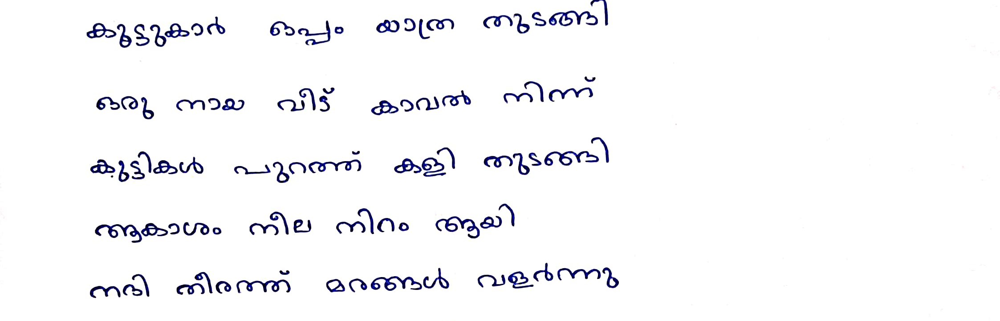


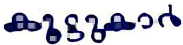
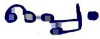
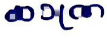
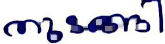


...
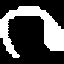
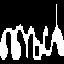


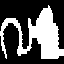
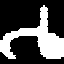
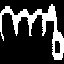

'ംുടങ്കാർ ഘ ംീത നുഞ്ഞി\nഅ്ര നഫ ഹ്വ ംബർ നിന്ന\nംഫഏ പഞ്ഞ ംി ത്തങ്ങി\nഞ്ചശ നില നിറ് ഝി\nന്നി ന്നറന്ന ംറഞ്ഞ മ്പർത്ത\n'

In [49]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy import ndimage
import torch
from fastai.vision import *
from fastai.metrics import accuracy
import json
from google.colab import files
from IPython.display import display, HTML, Image
from PIL import Image as PILImage

# Create necessary directories
for folder in ['uploads', 'output/png', 'output/png_x64', 'output/svg', 'output/words']:
    os.makedirs(folder, exist_ok=True)

def predict_alphabets(image_path):
    """Predict Malayalam character from image using pre-trained model"""
    print(f"Predicting character from: {image_path}")
    defaults.device = torch.device("cpu")

    # Malayalam alphabets mapping
    alphabets = ['്', 'ാ', 'ി', 'ീ', 'ു', 'ൂ', 'െ', 'ൃ', 'െ', 'ൌ', 'ം', 'അ', 'ആ', 'ഇ', 'ഉ', 'ഋ', 'എ', 'ഏ', 'ഒ', 'ക', 'ഖ', 'ഗ', 'ഘ', 'ങ', 'ച', 'ഛ', 'ജ', 'ഝ', 'ഞ', 'ട', 'ഠ', 'ഡ', 'ഢ', 'ണ', 'ത', 'ഫ', 'ദ', 'ധ', 'ന', 'പ', 'ഫ', 'ബ', 'ഭ', 'മ', 'യ', 'ര',
                 'റ', 'ല', 'ള', 'ഴ', 'വ', 'ശ', 'ഷ', 'സ', 'ഹ', 'ൺ', 'ൻ', 'ർ', 'ൽ', 'ൾ', 'ക്ക', 'ക്ഷ', 'ങ്ക', 'ങ്ങ', 'ച്ച', 'ഞ്ച', 'ഞ്ഞ', 'ട്ട', 'ണ്ട', 'ണ്ണ', 'ത്ത', 'ദ്ധ', 'ന്ത', 'ന്ദ', 'ന്ന', 'പ്പ', 'മ്പ', 'മ്മ', 'യ്യ', 'ല്ല', 'ള്ള', 'വ്വ', '്യ', '്ര', '്വ']

    # Label mapping (you'll need to download or train these models)
    labels = {'12': 20, '54': 59, '79': 81, '26': 33, '83': 85, '11': 2, '18': 26, '55': 6, '42': 48, '14': 22, '36': 42, '63': 67, '57': 61, '60': 64, '70': 73, '31': 38, '65': 69, '0': 1, '73': 76, '51': 56, '17': 25, '84': 9, '1': 10, '64': 68, '38': 44, '47': 52, '23': 30, '68': 71, '80': 82, '75': 78, '30': 37, '72': 75, '82': 84, '43': 49, '62': 66, '49': 54, '77': 8, '5': 14, '34': 40, '16': 24, '25': 32, '29': 36,
              '39': 45, '21': 29, '74': 77, '46': 51, '44': 5, '27': 34, '35': 41, '37': 43, '58': 62, '9': 18, '4': 13, '41': 47, '40': 46, '81': 83, '67': 70, '59': 63, '69': 72, '52': 57, '78': 80, '15': 23, '33': 4, '24': 31, '22': 3, '76': 79, '10': 19, '3': 12, '50': 55, '28': 35, '6': 15, '19': 27, '2': 11, '7': 16, '53': 58, '32': 39, '61': 65, '8': 17, '13': 21, '45': 50, '71': 74, '44': 5, '48': 53, '56': 60, '20': 28, '66': 7}

    # For demo purposes, we'll need to download the model files first
    # !wget https://example.com/alexnet_non_pretrained_bs32.pkl
    # !wget https://example.com/resnet_18_non-pre_trained.pkl

    # Ensemble models
    ens = ["/content/alexnet_non_pretrained_bs32.pkl", "/content/resnet_18_non-pre_trained.pkl"]
    ens_test_preds = []

    # If models don't exist, return a placeholder
    if not all(os.path.exists(mod) for mod in ens):
        print("Warning: Model files not found. Please download the model files first.")
        return "അ"  # Return a placeholder character

    for mod in ens:
        learn = load_learner(path='.', file=mod)
        img = open_image(image_path)
        pred_class, pred_idx, outputs = learn.predict(img)
        ens_test_preds.append(np.array(outputs))

    ens_preds = np.mean(ens_test_preds, axis=0)
    predicted_char = alphabets[int(labels[str(np.argmax(ens_preds))]) - 1]
    return predicted_char

def _edge_detect(im):
    """Detect edges in image using Sobel operator"""
    return np.max(np.array([_sobel_detect(im[:, :, 0]),
                           _sobel_detect(im[:, :, 1]),
                           _sobel_detect(im[:, :, 2])]), axis=0)

def _sobel_detect(channel):
    """Apply Sobel edge detection to an image channel"""
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def sort_words(boxes):
    """Sort word boxes horizontally (left to right)"""
    # Sort boxes by x-coordinate (horizontal position)
    return sorted(boxes, key=lambda box: box[2])

def sort_lines(boxes):
    """Sort boxes into lines by vertical position (top to bottom)"""
    # Sort all boxes by y-coordinate (vertical position)
    return sorted(boxes, key=lambda box: box[0])

def group_into_lines(boxes, max_y_distance=20):
    """Group boxes into lines based on vertical position"""
    if not boxes:
        return []

    # First sort boxes by vertical position
    sorted_boxes = sort_lines(boxes)

    lines = []
    current_line = [sorted_boxes[0]]
    current_y = sorted_boxes[0][0]  # Top y-coordinate of first box

    for box in sorted_boxes[1:]:
        # If this box is close enough vertically to the current line
        if abs(box[0] - current_y) <= max_y_distance:
            current_line.append(box)
        else:
            # Start a new line
            lines.append(sort_words(current_line))  # Sort words in the line horizontally
            current_line = [box]
            current_y = box[0]

    # Add the last line
    if current_line:
        lines.append(sort_words(current_line))

    return lines

def scale_boxes(new_img, old_img, coords):
    """Scale coordinates from one image size to another"""
    coords[0] = int((coords[0]) * new_img.shape[0] / old_img.shape[0])  # new top left
    coords[1] = int((coords[1]) * new_img.shape[0] / old_img.shape[0])  # new bottom left
    coords[2] = int((coords[2]) * new_img.shape[1] / old_img.shape[1])  # new top right
    coords[3] = int((coords[3]) * new_img.shape[1] / old_img.shape[1])  # new bottom right
    return coords

def clipping_image(new):
    """Clip image to content boundaries"""
    colsums = np.sum(new, axis=0)
    linessum = np.sum(new, axis=1)
    colsums2 = np.nonzero(0-colsums)
    linessum2 = np.nonzero(0-linessum)

    if linessum2[0].size == 0 or colsums2[0].size == 0:
        return new, [0, new.shape[0], 0, new.shape[1]]

    x = linessum2[0][0]  # top left
    xh = linessum2[0][linessum2[0].shape[0]-1]  # bottom left
    y = colsums2[0][0]  # top right
    yw = colsums2[0][colsums2[0].shape[0]-1]  # bottom right

    imgcrop = new[x:xh, y:yw]  # crop the image

    return imgcrop, [x, xh, y, yw]

def padding_resizing_image(img, reduce_size):
    """Add padding and resize image"""
    # Add padding to image
    img = cv2.copyMakeBorder(img, 2, 2, 0, 0, cv2.BORDER_CONSTANT)
    try:
        # Resize the image to specified size
        img = cv2.resize(np.uint8(img), (reduce_size, reduce_size))
    except Exception as e:
        print(f"Error resizing image: {e}")
    return img

def segmentation(img, sequence, origimg=None, lineNo=None, wordNo=None, filename=None):
    """Segment image into lines, words or characters"""
    if sequence == "line":  # resize to find lines
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 20
    elif sequence == "word":  # resize to find the words
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 18
    elif sequence == "character":  # resize to find the characters
        width = img.shape[1]
        height = img.shape[0]
        sigma = 0

    img = cv2.resize(img, (width, height))
    blurred = cv2.GaussianBlur(img, (5, 5), sigma)  # apply gaussian blur

    if sequence in ["line", "word"]:
        blurred = _edge_detect(blurred)  # edge detect in blurred image
        # Otsu's thresholding with Binary
        ret, img = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

        if sequence == "line":
            # For line detection, use horizontal morphology
            kernel = np.ones((5, 80), np.uint8)
            img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
        else:  # word
            # For word detection, use balanced morphology
            img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, np.ones((15, 15), np.uint8))

    elif sequence == "character":
        # Otsu's thresholding with Binary Inverted
        ret, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

    num_labels, labels_im = cv2.connectedComponents(img)  # find connected components

    if sequence in ["line", "word"]:
        boxes = []  # for storing the coordinates of the bounding boxes
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)

            # Filter out very small boxes
            min_height = 10
            min_width = 10
            if sequence == "line":
                min_width = 100  # Lines should be wider

            if not (new.shape[0] < min_height or new.shape[1] < min_width):
                boxes.append(new_coord)

        return img, boxes

    if sequence == "character":
        boxes = []
        label_box = []
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)
            if not (new.shape[0] < 10 or new.shape[1] < 10):
                label_box.append([i, new_coord])

        # Sort characters horizontally
        label_box = sorted(label_box, key=lambda x: x[1][2])  # Sort by x coordinate
        chNo = 0

        # Create output directory if it doesn't exist
        os.makedirs(os.path.join('output/png', filename), exist_ok=True)
        os.makedirs(os.path.join('output/png_x64', filename), exist_ok=True)

        for box in label_box:
            ch_img, nr_objects = ndimage.label(labels_im == box[0])
            ch_img, new_coord = clipping_image(ch_img)
            cropped_image = padding_resizing_image(ch_img, 32)
            cropped_image_x64 = padding_resizing_image(ch_img, 64)

            try:
                dst = os.path.join('output/png', filename, f"{lineNo}_{wordNo}_{chNo}.png")
                dst_x64 = os.path.join('output/png_x64', filename, f"{lineNo}_{wordNo}_{chNo}.png")
                plt.imsave(dst, cropped_image, cmap=cm.gray)
                plt.imsave(dst_x64, cropped_image_x64, cmap=cm.gray)
            except Exception as e:
                print(f"Error saving segmented character: {e}")

            chNo += 1

        return img, boxes

def img_to_seg(img, filename):
    """Segment image into lines, words and characters"""
    # Change image width to 1280px
    img = cv2.resize(img, (1280, int(img.shape[0] * (1280 / img.shape[1]))))
    kernel = np.ones((5, 5), np.uint8)  # kernel for opening
    # Opening image to remove minor noise
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    # Step 1: Line segmentation
    new_img, line_boxes = segmentation(img, "line")
    if not line_boxes:
        return "0", 0

    # Group boxes into lines
    line_boxes = group_into_lines(line_boxes)

    # Scale line coordinates to original image
    scaled_line_boxes = []
    for line in line_boxes:
        scaled_line = []
        for box in line:
            scaled_box = scale_boxes(img, new_img, box.copy())
            scaled_line.append(scaled_box)
        scaled_line_boxes.append(scaled_line)

    # Process each line
    lineNo = 0
    total_words = 0
    line_word_counts = {}
    word_images = {}  # Store word images for display

    # Create output directory for word images
    os.makedirs(os.path.join('output/words', filename), exist_ok=True)

    for line_boxes in scaled_line_boxes:
        line_img = img[min(box[0] for box in line_boxes):max(box[1] for box in line_boxes), :]

        # Word segmentation within the line
        word_img, word_boxes = segmentation(line_img, "word")
        if not word_boxes:
            continue

        # Scale word coordinates to line image
        scaled_word_boxes = []
        for box in word_boxes:
            scaled_box = scale_boxes(line_img, word_img, box.copy())
            scaled_word_boxes.append(scaled_box)

        # Sort words horizontally
        scaled_word_boxes = sort_words(scaled_word_boxes)

        wordNo = 0
        line_word_counts[lineNo] = 0
        word_images[lineNo] = {}

        for word_box in scaled_word_boxes:
            # Check if the coordinates are valid
            if word_box[0] >= word_box[1] or word_box[2] >= word_box[3]:
                continue
            if word_box[0] < 0 or word_box[2] < 0 or word_box[1] >= line_img.shape[0] or word_box[3] >= line_img.shape[1]:
                continue

            # Extract word image
            word_img_rgb = line_img[word_box[0]:word_box[1], word_box[2]:word_box[3]]
            word_img_gray = cv2.cvtColor(word_img_rgb, cv2.COLOR_BGR2GRAY)

            # Save word image
            word_path = os.path.join('output/words', filename, f"{lineNo}_{wordNo}.png")
            plt.imsave(word_path, word_img_rgb)
            word_images[lineNo][wordNo] = word_path

            # Segment into characters
            char_img, _ = segmentation(word_img_gray, "character", None, lineNo, wordNo, filename)
            wordNo += 1
            line_word_counts[lineNo] += 1
            total_words += 1

        lineNo += 1

    return "1", total_words, line_word_counts, word_images

# Function to process the uploaded image
def process_image(img_path):
    """Process the uploaded image and recognize text"""
    filename = os.path.basename(img_path)
    base_filename = os.path.splitext(filename)[0]

    # Create output directories
    for subdir in ['png', 'png_x64', 'svg', 'words']:
        os.makedirs(os.path.join('output', subdir, base_filename), exist_ok=True)

    # Read and process the image
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    status, word_count, line_word_counts, word_images = img_to_seg(img, base_filename)

    if status != "1" or word_count == 0:
        return "No text was detected in the image. Please try with a clearer image."

    # Dictionary to store predicted characters
    alpha = {}
    for line_no in line_word_counts:
        alpha[str(line_no)] = {}
        for word_no in range(line_word_counts[line_no]):
            alpha[str(line_no)][str(word_no)] = {}

    # Process each character image and predict
    for f in os.listdir(os.path.join('output/png', base_filename)):
        if not f.endswith('.png'):
            continue

        try:
            character = predict_alphabets(os.path.join('output/png', base_filename, f))
            parts = f.split("_")
            line_idx = parts[0]
            word_idx = parts[1]
            char_idx = parts[2].split(".")[0]

            if line_idx not in alpha:
                alpha[line_idx] = {}
            if word_idx not in alpha[line_idx]:
                alpha[line_idx][word_idx] = {}

            alpha[line_idx][word_idx][char_idx] = character
        except Exception as e:
            print(f"Error predicting character {f}: {e}")

    # Construct recognized text
    paragraph = ""

    # Process each line
    for line_no in sorted(alpha.keys(), key=int):
        line_text = ""

        # Process each word in the line
        for word_no in sorted(alpha[line_no].keys(), key=int):
            word_text = ""

            # Process each character in the word
            for char_no in sorted(alpha[line_no][word_no].keys(), key=int):
                word_text += alpha[line_no][word_no][char_no]

            if word_text:
                line_text += word_text + " "

        if line_text:
            paragraph += line_text.strip() + "\n"

    # Display the results
    display(HTML(f"<h2>Recognized Text:</h2><p style='font-size:20px; white-space: pre-line;'>{paragraph}</p>"))

    # Display the original image
    display(HTML("<h2>Original Image:</h2>"))
    display(PILImage.open(img_path))

    # Display segmented words
    display(HTML("<h2>Segmented Words:</h2>"))

    for line_idx in sorted(word_images.keys(), key=int):
        display(HTML(f"<h3>Line {int(line_idx)+1}:</h3>"))

        line_display = "<div style='display:flex; flex-wrap:wrap; gap:10px; margin-bottom:15px;'>"

        for word_idx in sorted(word_images[line_idx].keys(), key=int):
            word_img_path = word_images[line_idx][word_idx]

            # Get the predicted text for this word
            word_text = ""
            if line_idx in alpha and word_idx in alpha[str(line_idx)]:
                for char_idx in sorted(alpha[str(line_idx)][str(word_idx)].keys(), key=int):
                    word_text += alpha[str(line_idx)][str(word_idx)][char_idx]

            # Create a base64 representation of the image for display
            with open(word_img_path, "rb") as img_file:
                img_data = img_file.read()
                img_base64 = base64.b64encode(img_data).decode('utf-8')

            line_display += f"""
            <div style='border:1px solid #ddd; border-radius:5px; padding:10px; text-align:center;'>
                <img src='data:image/png;base64,{img_base64}' style='max-height:100px; max-width:200px;' />
                <div style='margin-top:5px; font-weight:bold;'>{word_text}</div>
            </div>
            """

        line_display += "</div>"
        display(HTML(line_display))

    # Display the segmented characters with line and word structure
    display(HTML("<h2>Segmented Characters:</h2>"))

    for line_idx in sorted(alpha.keys(), key=int):
        display(HTML(f"<h3>Line {int(line_idx)+1}:</h3>"))

        for word_idx in sorted(alpha[line_idx].keys(), key=int):
            word_display = f"<div style='display:flex; margin-bottom:10px;'>"

            for char_idx in sorted(alpha[line_idx][word_idx].keys(), key=int):
                char_img_path = os.path.join('output/png_x64', base_filename, f"{line_idx}_{word_idx}_{char_idx}.png")
                if os.path.exists(char_img_path):
                    char = alpha[line_idx][word_idx][char_idx]

                    # Create a base64 representation of the image for display
                    with open(char_img_path, "rb") as img_file:
                        img_data = img_file.read()
                        img_base64 = base64.b64encode(img_data).decode('utf-8')

                    word_display += f"<div style='text-align:center; margin-right:5px;'><img src='data:image/png;base64,{img_base64}' width='50'/><br/>{char}</div>"

            word_display += "</div>"
            display(HTML(word_display))

    return paragraph

# Function to handle file upload
def upload_and_process():
    """Upload and process image"""
    uploaded = files.upload()

    if not uploaded:
        print("No file was uploaded.")
        return

    filename = list(uploaded.keys())[0]
    file_path = os.path.join('uploads', filename)

    # Save the uploaded file
    with open(file_path, 'wb') as f:
        f.write(uploaded[filename])

    # Process the image
    result = process_image(file_path)
    return result

# UI for uploading and processing image
from IPython.display import HTML, display
import base64

display(HTML("""
<div style="background-color:#f8f9fa; padding:20px; border-radius:10px; margin-bottom:20px;">
    <h1 style="text-align:center; color:#343a40;">Malayalam Handwritten Paragraph Recognition</h1>
    <p style="text-align:center; color:#6c757d;">Upload an image with handwritten Malayalam paragraphs</p>
</div>
"""))

print("Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.")
print("For demo purposes, the character prediction will return a placeholder if models are not found.")

# Call the upload function
upload_and_process()

Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.
For demo purposes, the character prediction will return a placeholder if models are not found.


Saving pic3.jpeg to pic3 (4).jpeg
Predicting character from: output/png/pic3 (4)/3_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_3_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_1_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_0_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_0_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_0_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_1_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_4_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_3_4.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_4_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_0_4.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_2_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_0_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_0_4.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_4_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_0_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_2_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_0_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_3_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_3_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_1_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_1_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_3_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/2_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_0_5.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_1_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/0_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/3_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/4_1_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic3 (4)/1_2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

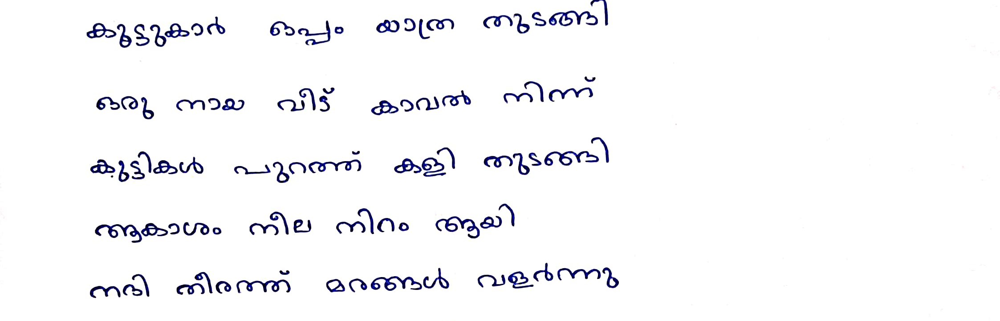


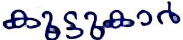
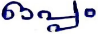
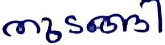


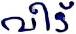
...


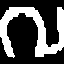
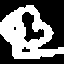
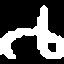
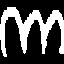
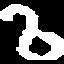

'കുട്ടഷാർ ഒപ്പ ംാ്രത തുടങ്ങ\nഅ്ര നാഫ വീാ കാവൽ നിന്ന\nംംട്ടൂൾ പുറത്ത ക്ഷി ത്തയ്യങ്ങി\nഞ്ഞാശ നീല നിറം അയി\nനരി നിറത്ത മറഞ്ഞ വളർന്നു\n'

In [51]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy import ndimage
import torch
from fastai.vision import *
from fastai.metrics import accuracy
import json
from google.colab import files
from IPython.display import display, HTML, Image
from PIL import Image as PILImage

# Create necessary directories
for folder in ['uploads', 'output/png', 'output/png_x64', 'output/svg', 'output/words']:
    os.makedirs(folder, exist_ok=True)

def predict_alphabets(image_path):
    """Predict Malayalam character from image using pre-trained model"""
    print(f"Predicting character from: {image_path}")
    defaults.device = torch.device("cpu")

    # Malayalam alphabets mapping
    alphabets = ['്', 'ാ', 'ി', 'ീ', 'ു', 'ൂ', 'െ', 'ൃ', 'െ', 'ൌ', 'ം', 'അ', 'ആ', 'ഇ', 'ഉ', 'ഋ', 'എ', 'ഏ', 'ഒ', 'ക', 'ഖ', 'ഗ', 'ഘ', 'ങ', 'ച', 'ഛ', 'ജ', 'ഝ', 'ഞ', 'ട', 'ഠ', 'ഡ', 'ഢ', 'ണ', 'ത', 'ഫ', 'ദ', 'ധ', 'ന', 'പ', 'ഫ', 'ബ', 'ഭ', 'മ', 'യ', 'ര',
                 'റ', 'ല', 'ള', 'ഴ', 'വ', 'ശ', 'ഷ', 'സ', 'ഹ', 'ൺ', 'ൻ', 'ർ', 'ൽ', 'ൾ', 'ക്ക', 'ക്ഷ', 'ങ്ക', 'ങ്ങ', 'ച്ച', 'ഞ്ച', 'ഞ്ഞ', 'ട്ട', 'ണ്ട', 'ണ്ണ', 'ത്ത', 'ദ്ധ', 'ന്ത', 'ന്ദ', 'ന്ന', 'പ്പ', 'മ്പ', 'മ്മ', 'യ്യ', 'ല്ല', 'ള്ള', 'വ്വ', '്യ', '്ര', '്വ']

    # Label mapping (you'll need to download or train these models)
    labels = {'12': 20, '54': 59, '79': 81, '26': 33, '83': 85, '11': 2, '18': 26, '55': 6, '42': 48, '14': 22, '36': 42, '63': 67, '57': 61, '60': 64, '70': 73, '31': 38, '65': 69, '0': 1, '73': 76, '51': 56, '17': 25, '84': 9, '1': 10, '64': 68, '38': 44, '47': 52, '23': 30, '68': 71, '80': 82, '75': 78, '30': 37, '72': 75, '82': 84, '43': 49, '62': 66, '49': 54, '77': 8, '5': 14, '34': 40, '16': 24, '25': 32, '29': 36,
              '39': 45, '21': 29, '74': 77, '46': 51, '44': 5, '27': 34, '35': 41, '37': 43, '58': 62, '9': 18, '4': 13, '41': 47, '40': 46, '81': 83, '67': 70, '59': 63, '69': 72, '52': 57, '78': 80, '15': 23, '33': 4, '24': 31, '22': 3, '76': 79, '10': 19, '3': 12, '50': 55, '28': 35, '6': 15, '19': 27, '2': 11, '7': 16, '53': 58, '32': 39, '61': 65, '8': 17, '13': 21, '45': 50, '71': 74, '44': 5, '48': 53, '56': 60, '20': 28, '66': 7}

    # For demo purposes, we'll need to download the model files first
    # !wget https://example.com/alexnet_non_pretrained_bs32.pkl
    # !wget https://example.com/resnet_18_non-pre_trained.pkl

    # Ensemble models
    ens = ["/content/alexnet_non_pretrained_bs32.pkl", "/content/resnet_18_non-pre_trained.pkl"]
    ens_test_preds = []

    # If models don't exist, return a placeholder
    if not all(os.path.exists(mod) for mod in ens):
        print("Warning: Model files not found. Please download the model files first.")
        return "അ"  # Return a placeholder character

    for mod in ens:
        learn = load_learner(path='.', file=mod)
        img = open_image(image_path)
        pred_class, pred_idx, outputs = learn.predict(img)
        ens_test_preds.append(np.array(outputs))

    ens_preds = np.mean(ens_test_preds, axis=0)
    predicted_char = alphabets[int(labels[str(np.argmax(ens_preds))]) - 1]
    return predicted_char

def _edge_detect(im):
    """Detect edges in image using Sobel operator"""
    return np.max(np.array([_sobel_detect(im[:, :, 0]),
                           _sobel_detect(im[:, :, 1]),
                           _sobel_detect(im[:, :, 2])]), axis=0)

def _sobel_detect(channel):
    """Apply Sobel edge detection to an image channel"""
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def sort_words(boxes):
    """Sort word boxes horizontally (left to right)"""
    # Sort boxes by x-coordinate (horizontal position)
    return sorted(boxes, key=lambda box: box[2])

def sort_lines(boxes):
    """Sort boxes into lines by vertical position (top to bottom)"""
    # Sort all boxes by y-coordinate (vertical position)
    return sorted(boxes, key=lambda box: box[0])

def group_into_lines(boxes, max_y_distance=20):
    """Group boxes into lines based on vertical position"""
    if not boxes:
        return []

    # First sort boxes by vertical position
    sorted_boxes = sort_lines(boxes)

    lines = []
    current_line = [sorted_boxes[0]]
    current_y = sorted_boxes[0][0]  # Top y-coordinate of first box

    for box in sorted_boxes[1:]:
        # If this box is close enough vertically to the current line
        if abs(box[0] - current_y) <= max_y_distance:
            current_line.append(box)
        else:
            # Start a new line
            lines.append(sort_words(current_line))  # Sort words in the line horizontally
            current_line = [box]
            current_y = box[0]

    # Add the last line
    if current_line:
        lines.append(sort_words(current_line))

    return lines

def scale_boxes(new_img, old_img, coords):
    """Scale coordinates from one image size to another"""
    coords[0] = int((coords[0]) * new_img.shape[0] / old_img.shape[0])  # new top left
    coords[1] = int((coords[1]) * new_img.shape[0] / old_img.shape[0])  # new bottom left
    coords[2] = int((coords[2]) * new_img.shape[1] / old_img.shape[1])  # new top right
    coords[3] = int((coords[3]) * new_img.shape[1] / old_img.shape[1])  # new bottom right
    return coords

def clipping_image(new):
    """Clip image to content boundaries"""
    colsums = np.sum(new, axis=0)
    linessum = np.sum(new, axis=1)
    colsums2 = np.nonzero(0-colsums)
    linessum2 = np.nonzero(0-linessum)

    if linessum2[0].size == 0 or colsums2[0].size == 0:
        return new, [0, new.shape[0], 0, new.shape[1]]

    x = linessum2[0][0]  # top left
    xh = linessum2[0][linessum2[0].shape[0]-1]  # bottom left
    y = colsums2[0][0]  # top right
    yw = colsums2[0][colsums2[0].shape[0]-1]  # bottom right

    imgcrop = new[x:xh, y:yw]  # crop the image

    return imgcrop, [x, xh, y, yw]

def padding_resizing_image(img, reduce_size):
    """Add padding and resize image"""
    # Add padding to image
    img = cv2.copyMakeBorder(img, 2, 2, 0, 0, cv2.BORDER_CONSTANT)
    try:
        # Resize the image to specified size
        img = cv2.resize(np.uint8(img), (reduce_size, reduce_size))
    except Exception as e:
        print(f"Error resizing image: {e}")
    return img

def segmentation(img, sequence, origimg=None, lineNo=None, wordNo=None, filename=None):
    """Segment image into lines, words or characters with reduced preprocessing"""
    if sequence == "line":  # resize to find lines
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 10  # Reduced from 20
    elif sequence == "word":  # resize to find the words
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 8  # Reduced from 18
    elif sequence == "character":  # resize to find the characters
        width = img.shape[1]
        height = img.shape[0]
        sigma = 0

    img = cv2.resize(img, (width, height))

    # Apply lighter blur for line and word segmentation
    if sequence in ["line", "word"]:
        blurred = cv2.GaussianBlur(img, (3, 3), sigma)  # Smaller kernel (3x3 instead of 5x5)
        blurred = _edge_detect(blurred)
        # Otsu's thresholding with Binary
        ret, img = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

        if sequence == "line":
            # Use smaller kernel for line detection
            kernel = np.ones((3, 40), np.uint8)  # Reduced from 5x80
            img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
        else:  # word
            # Use smaller kernel for word detection
            kernel = np.ones((10, 10), np.uint8)  # Reduced from 15x15
            img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    elif sequence == "character":
        # For character segmentation, try a gentle Gaussian blur before thresholding
        img = cv2.GaussianBlur(img, (3, 3), 1)
        # Otsu's thresholding with Binary Inverted
        ret, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

    num_labels, labels_im = cv2.connectedComponents(img)  # find connected components

    if sequence in ["line", "word"]:
        boxes = []  # for storing the coordinates of the bounding boxes
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)

            # Filter out very small boxes
            min_height = 10
            min_width = 10
            if sequence == "line":
                min_width = 100  # Lines should be wider

            if not (new.shape[0] < min_height or new.shape[1] < min_width):
                boxes.append(new_coord)

        return img, boxes

    if sequence == "character":
        boxes = []
        label_box = []
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)
            if not (new.shape[0] < 10 or new.shape[1] < 10):
                label_box.append([i, new_coord])

        # Sort characters horizontally
        label_box = sorted(label_box, key=lambda x: x[1][2])  # Sort by x coordinate
        chNo = 0

        # Create output directory if it doesn't exist
        os.makedirs(os.path.join('output/png', filename), exist_ok=True)
        os.makedirs(os.path.join('output/png_x64', filename), exist_ok=True)

        for box in label_box:
            ch_img, nr_objects = ndimage.label(labels_im == box[0])
            ch_img, new_coord = clipping_image(ch_img)
            cropped_image = padding_resizing_image(ch_img, 32)
            cropped_image_x64 = padding_resizing_image(ch_img, 64)

            try:
                dst = os.path.join('output/png', filename, f"{lineNo}_{wordNo}_{chNo}.png")
                dst_x64 = os.path.join('output/png_x64', filename, f"{lineNo}_{wordNo}_{chNo}.png")
                plt.imsave(dst, cropped_image, cmap=cm.gray)
                plt.imsave(dst_x64, cropped_image_x64, cmap=cm.gray)
            except Exception as e:
                print(f"Error saving segmented character: {e}")

            chNo += 1

        return img, boxes

def img_to_seg(img, filename):
    """Segment image into lines, words and characters with minimal preprocessing"""
    # Change image width to 1280px but only if necessary
    if img.shape[1] > 1280:
        img = cv2.resize(img, (1280, int(img.shape[0] * (1280 / img.shape[1]))))

    # Use a smaller kernel and lighter opening
    kernel = np.ones((3, 3), np.uint8)  # Reduced from 5x5
    # Consider making the opening optional or lighter
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1)

    # Rest of the function remains the same...

    # Step 1: Line segmentation
    new_img, line_boxes = segmentation(img, "line")
    if not line_boxes:
        return "0", 0

    # Group boxes into lines
    line_boxes = group_into_lines(line_boxes)

    # Scale line coordinates to original image
    scaled_line_boxes = []
    for line in line_boxes:
        scaled_line = []
        for box in line:
            scaled_box = scale_boxes(img, new_img, box.copy())
            scaled_line.append(scaled_box)
        scaled_line_boxes.append(scaled_line)

    # Process each line
    lineNo = 0
    total_words = 0
    line_word_counts = {}
    word_images = {}  # Store word images for display

    # Create output directory for word images
    os.makedirs(os.path.join('output/words', filename), exist_ok=True)

    for line_boxes in scaled_line_boxes:
        line_img = img[min(box[0] for box in line_boxes):max(box[1] for box in line_boxes), :]

        # Word segmentation within the line
        word_img, word_boxes = segmentation(line_img, "word")
        if not word_boxes:
            continue

        # Scale word coordinates to line image
        scaled_word_boxes = []
        for box in word_boxes:
            scaled_box = scale_boxes(line_img, word_img, box.copy())
            scaled_word_boxes.append(scaled_box)

        # Sort words horizontally
        scaled_word_boxes = sort_words(scaled_word_boxes)

        wordNo = 0
        line_word_counts[lineNo] = 0
        word_images[lineNo] = {}

        for word_box in scaled_word_boxes:
            # Check if the coordinates are valid
            if word_box[0] >= word_box[1] or word_box[2] >= word_box[3]:
                continue
            if word_box[0] < 0 or word_box[2] < 0 or word_box[1] >= line_img.shape[0] or word_box[3] >= line_img.shape[1]:
                continue

            # Extract word image
            word_img_rgb = line_img[word_box[0]:word_box[1], word_box[2]:word_box[3]]
            word_img_gray = cv2.cvtColor(word_img_rgb, cv2.COLOR_BGR2GRAY)

            # Save word image
            word_path = os.path.join('output/words', filename, f"{lineNo}_{wordNo}.png")
            plt.imsave(word_path, word_img_rgb)
            word_images[lineNo][wordNo] = word_path

            # Segment into characters
            char_img, _ = segmentation(word_img_gray, "character", None, lineNo, wordNo, filename)
            wordNo += 1
            line_word_counts[lineNo] += 1
            total_words += 1

        lineNo += 1

    return "1", total_words, line_word_counts, word_images

# Function to process the uploaded image
def process_image(img_path):
    """Process the uploaded image and recognize text"""
    filename = os.path.basename(img_path)
    base_filename = os.path.splitext(filename)[0]

    # Create output directories
    for subdir in ['png', 'png_x64', 'svg', 'words']:
        os.makedirs(os.path.join('output', subdir, base_filename), exist_ok=True)

    # Read and process the image
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    status, word_count, line_word_counts, word_images = img_to_seg(img, base_filename)

    if status != "1" or word_count == 0:
        return "No text was detected in the image. Please try with a clearer image."

    # Dictionary to store predicted characters
    alpha = {}
    for line_no in line_word_counts:
        alpha[str(line_no)] = {}
        for word_no in range(line_word_counts[line_no]):
            alpha[str(line_no)][str(word_no)] = {}

    # Process each character image and predict
    for f in os.listdir(os.path.join('output/png', base_filename)):
        if not f.endswith('.png'):
            continue

        try:
            character = predict_alphabets(os.path.join('output/png', base_filename, f))
            parts = f.split("_")
            line_idx = parts[0]
            word_idx = parts[1]
            char_idx = parts[2].split(".")[0]

            if line_idx not in alpha:
                alpha[line_idx] = {}
            if word_idx not in alpha[line_idx]:
                alpha[line_idx][word_idx] = {}

            alpha[line_idx][word_idx][char_idx] = character
        except Exception as e:
            print(f"Error predicting character {f}: {e}")

    # Construct recognized text
    paragraph = ""

    # Process each line
    for line_no in sorted(alpha.keys(), key=int):
        line_text = ""

        # Process each word in the line
        for word_no in sorted(alpha[line_no].keys(), key=int):
            word_text = ""

            # Process each character in the word
            for char_no in sorted(alpha[line_no][word_no].keys(), key=int):
                word_text += alpha[line_no][word_no][char_no]

            if word_text:
                line_text += word_text + " "

        if line_text:
            paragraph += line_text.strip() + "\n"

    # Display the results
    display(HTML(f"<h2>Recognized Text:</h2><p style='font-size:20px; white-space: pre-line;'>{paragraph}</p>"))

    # Display the original image
    display(HTML("<h2>Original Image:</h2>"))
    display(PILImage.open(img_path))

    # Display segmented words
    display(HTML("<h2>Segmented Words:</h2>"))

    for line_idx in sorted(word_images.keys(), key=int):
        display(HTML(f"<h3>Line {int(line_idx)+1}:</h3>"))

        line_display = "<div style='display:flex; flex-wrap:wrap; gap:10px; margin-bottom:15px;'>"

        for word_idx in sorted(word_images[line_idx].keys(), key=int):
            word_img_path = word_images[line_idx][word_idx]

            # Get the predicted text for this word
            word_text = ""
            if line_idx in alpha and word_idx in alpha[str(line_idx)]:
                for char_idx in sorted(alpha[str(line_idx)][str(word_idx)].keys(), key=int):
                    word_text += alpha[str(line_idx)][str(word_idx)][char_idx]

            # Create a base64 representation of the image for display
            with open(word_img_path, "rb") as img_file:
                img_data = img_file.read()
                img_base64 = base64.b64encode(img_data).decode('utf-8')

            line_display += f"""
            <div style='border:1px solid #ddd; border-radius:5px; padding:10px; text-align:center;'>
                <img src='data:image/png;base64,{img_base64}' style='max-height:100px; max-width:200px;' />
                <div style='margin-top:5px; font-weight:bold;'>{word_text}</div>
            </div>
            """

        line_display += "</div>"
        display(HTML(line_display))

    # Display the segmented characters with line and word structure
    display(HTML("<h2>Segmented Characters:</h2>"))

    for line_idx in sorted(alpha.keys(), key=int):
        display(HTML(f"<h3>Line {int(line_idx)+1}:</h3>"))

        for word_idx in sorted(alpha[line_idx].keys(), key=int):
            word_display = f"<div style='display:flex; margin-bottom:10px;'>"

            for char_idx in sorted(alpha[line_idx][word_idx].keys(), key=int):
                char_img_path = os.path.join('output/png_x64', base_filename, f"{line_idx}_{word_idx}_{char_idx}.png")
                if os.path.exists(char_img_path):
                    char = alpha[line_idx][word_idx][char_idx]

                    # Create a base64 representation of the image for display
                    with open(char_img_path, "rb") as img_file:
                        img_data = img_file.read()
                        img_base64 = base64.b64encode(img_data).decode('utf-8')

                    word_display += f"<div style='text-align:center; margin-right:5px;'><img src='data:image/png;base64,{img_base64}' width='50'/><br/>{char}</div>"

            word_display += "</div>"
            display(HTML(word_display))

    return paragraph

# Function to handle file upload
def upload_and_process():
    """Upload and process image"""
    uploaded = files.upload()

    if not uploaded:
        print("No file was uploaded.")
        return

    filename = list(uploaded.keys())[0]
    file_path = os.path.join('uploads', filename)

    # Save the uploaded file
    with open(file_path, 'wb') as f:
        f.write(uploaded[filename])

    # Process the image
    result = process_image(file_path)
    return result

# UI for uploading and processing image
from IPython.display import HTML, display
import base64

display(HTML("""
<div style="background-color:#f8f9fa; padding:20px; border-radius:10px; margin-bottom:20px;">
    <h1 style="text-align:center; color:#343a40;">Malayalam Handwritten Paragraph Recognition</h1>
    <p style="text-align:center; color:#6c757d;">Upload an image with handwritten Malayalam paragraphs</p>
</div>
"""))

print("Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.")
print("For demo purposes, the character prediction will return a placeholder if models are not found.")

# Call the upload function
upload_and_process()

Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.
For demo purposes, the character prediction will return a placeholder if models are not found.


Saving pic3.jpeg to pic3 (1).jpeg
Predicting character from: output/png/pic3 (1)/3_1_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_2_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_2_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_0_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_3_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_1_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_3_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_2_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_1_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_3_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_1_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_0_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_2_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_3_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_3_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_3_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_0_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_2_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_0_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_3_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_1_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_0_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_3_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_4_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_1_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_3_4.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_4_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_3_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_2_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_3_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_0_4.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_2_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_0_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_0_4.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_4_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_0_5.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_0_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_2_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_2_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_3_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_1_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_3_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_3_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_0_6.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_2_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_0_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_2_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_1_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_2_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_3_4.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_0_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_3_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_1_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_3_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_0_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_1_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_1_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_0_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_2_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_1_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_1_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_2_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_2_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_3_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_2_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_0_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_2_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_0_0.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_1_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_3_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/2_0_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_0_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_0_5.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_1_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_3_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_3_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/0_0_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_0_3.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/3_0_1.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/4_1_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

Predicting character from: output/png/pic3 (1)/1_2_2.png


/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.11/dist-packages/torch/serialization.py:1469: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attri

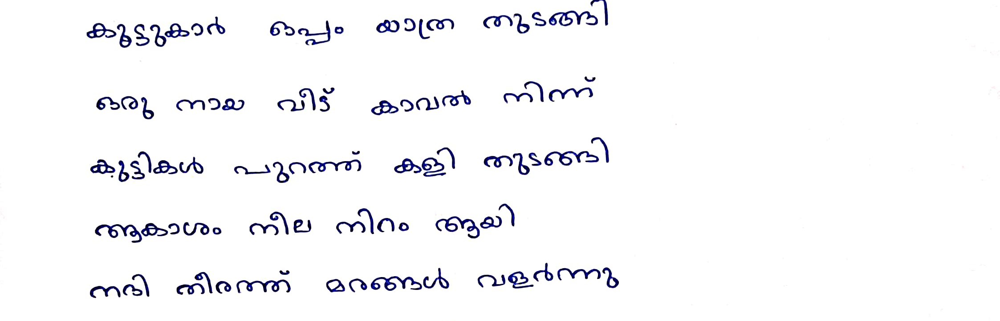


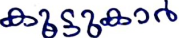
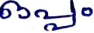
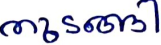


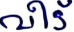
...


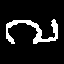
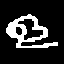
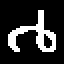
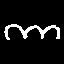
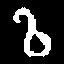

'ൂുട്ടിൂാർ ഒപ്പ ്വ്്രത തുടൺ\nഒര്വ ൻാൂ പീട്ട ൂാവൽ ി്വന്ന\nൂ്വട്ടിൂൾ ്ിറത്ത ൂളി ൂുട്ടൺി\nൺൂാശ ൻീല നിറം ആയ്യ്വ\nൻഭ്വ തീംത്ത ച്ചരൺൾ വളർന്നു\n'

In [60]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy import ndimage
import torch
from fastai.vision import *
from fastai.metrics import accuracy
import json
from google.colab import files
from IPython.display import display, HTML, Image
from PIL import Image as PILImage
import base64

# Create necessary directories
for folder in ['uploads', 'output/png', 'output/png_x64', 'output/svg', 'output/words']:
    os.makedirs(folder, exist_ok=True)

def predict_alphabets(image_path):
    """Predict Malayalam character from image using pre-trained model"""
    print(f"Predicting character from: {image_path}")
    defaults.device = torch.device("cpu")

    # Malayalam alphabets mapping
    alphabets = ['്', 'ാ', 'ി', 'ീ', 'ു', 'ൂ', 'െ', 'ൃ', 'െ', 'ൌ', 'ം', 'അ', 'ആ', 'ഇ', 'ഉ', 'ഋ', 'എ', 'ഏ', 'ഒ', 'ക', 'ഖ', 'ഗ', 'ഘ', 'ങ', 'ച', 'ഛ', 'ജ', 'ഝ', 'ഞ', 'ട', 'ഠ', 'ഡ', 'ഢ', 'ണ', 'ത', 'ഫ', 'ദ', 'ധ', 'ന', 'പ', 'ഫ', 'ബ', 'ഭ', 'മ', 'യ', 'ര',
                 'റ', 'ല', 'ള', 'ഴ', 'വ', 'ശ', 'ഷ', 'സ', 'ഹ', 'ൺ', 'ൻ', 'ർ', 'ൽ', 'ൾ', 'ക്ക', 'ക്ഷ', 'ങ്ക', 'ങ്ങ', 'ച്ച', 'ഞ്ച', 'ഞ്ഞ', 'ട്ട', 'ണ്ട', 'ണ്ണ', 'ത്ത', 'ദ്ധ', 'ന്ത', 'ന്ദ', 'ന്ന', 'പ്പ', 'മ്പ', 'മ്മ', 'യ്യ', 'ല്ല', 'ള്ള', 'വ്വ', '്യ', '്ര', '്വ']

    # Label mapping (you'll need to download or train these models)
    labels = {'12': 20, '54': 59, '79': 81, '26': 33, '83': 85, '11': 2, '18': 26, '55': 6, '42': 48, '14': 22, '36': 42, '63': 67, '57': 61, '60': 64, '70': 73, '31': 38, '65': 69, '0': 1, '73': 76, '51': 56, '17': 25, '84': 9, '1': 10, '64': 68, '38': 44, '47': 52, '23': 30, '68': 71, '80': 82, '75': 78, '30': 37, '72': 75, '82': 84, '43': 49, '62': 66, '49': 54, '77': 8, '5': 14, '34': 40, '16': 24, '25': 32, '29': 36,
              '39': 45, '21': 29, '74': 77, '46': 51, '44': 5, '27': 34, '35': 41, '37': 43, '58': 62, '9': 18, '4': 13, '41': 47, '40': 46, '81': 83, '67': 70, '59': 63, '69': 72, '52': 57, '78': 80, '15': 23, '33': 4, '24': 31, '22': 3, '76': 79, '10': 19, '3': 12, '50': 55, '28': 35, '6': 15, '19': 27, '2': 11, '7': 16, '53': 58, '32': 39, '61': 65, '8': 17, '13': 21, '45': 50, '71': 74, '44': 5, '48': 53, '56': 60, '20': 28, '66': 7}

    # For demo purposes, we'll need to download the model files first
    # !wget https://example.com/alexnet_non_pretrained_bs32.pkl
    # !wget https://example.com/resnet_18_non-pre_trained.pkl

    # Ensemble models
    ens = ["/content/alexnet_non_pretrained_bs32.pkl", "/content/resnet_18_non-pre_trained.pkl"]
    ens_test_preds = []

    # If models don't exist, return a placeholder
    if not all(os.path.exists(mod) for mod in ens):
        print("Warning: Model files not found. Please download the model files first.")
        return "അ"  # Return a placeholder character

    for mod in ens:
        learn = load_learner(path='.', file=mod)
        img = open_image(image_path)
        pred_class, pred_idx, outputs = learn.predict(img)
        ens_test_preds.append(np.array(outputs))

    ens_preds = np.mean(ens_test_preds, axis=0)
    predicted_char = alphabets[int(labels[str(np.argmax(ens_preds))]) - 1]
    return predicted_char

def _edge_detect(im):
    """Detect edges using Canny for better edge preservation"""
    gray = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY) if len(im.shape) == 3 else im
    # Auto-determine thresholds
    median_val = np.median(gray)
    lower = int(max(0, (1.0 - 0.33) * median_val))
    upper = int(min(255, (1.0 + 0.33) * median_val))
    return cv2.Canny(gray, lower, upper)

def _sobel_detect(channel):
    """Apply Sobel edge detection to an image channel"""
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def separate_touching_chars(binary_img):
    """Use watershed algorithm to separate touching characters"""
    # Distance transform
    dist = cv2.distanceTransform(binary_img, cv2.DIST_L2, 5)

    # Normalize to range 0-255 for visualization and thresholding
    cv2.normalize(dist, dist, 0, 255, cv2.NORM_MINMAX)
    dist = np.uint8(dist)

    # Find local maxima (character centers)
    _, maxima = cv2.threshold(dist, 0.7*dist.max(), 255, cv2.THRESH_BINARY)

    # Marker labeling
    _, markers = cv2.connectedComponents(maxima)

    # Apply watershed
    markers = markers + 1
    markers[binary_img == 0] = 0

    # Convert binary to BGR for watershed
    binary_bgr = cv2.cvtColor(binary_img, cv2.COLOR_GRAY2BGR)
    cv2.watershed(binary_bgr, markers)

    # Create result image (characters separated by boundaries)
    result = binary_img.copy()
    result[markers == -1] = 0  # Set watershed boundaries to background

    return result

def sort_words(boxes):
    """Sort word boxes horizontally (left to right)"""
    # Sort boxes by x-coordinate (horizontal position)
    return sorted(boxes, key=lambda box: box[2])

def sort_lines(boxes):
    """Sort boxes into lines by vertical position (top to bottom)"""
    # Sort all boxes by y-coordinate (vertical position)
    return sorted(boxes, key=lambda box: box[0])

def group_into_lines(boxes, max_y_distance=None):
    """Group boxes into lines with adaptive distance threshold"""
    if not boxes:
        return []

    # Sort boxes by vertical position
    sorted_boxes = sort_lines(boxes)

    # Calculate adaptive y-distance threshold based on average height
    if max_y_distance is None:
        heights = [box[1] - box[0] for box in sorted_boxes]
        avg_height = sum(heights) / len(heights) if heights else 20
        max_y_distance = avg_height * 0.6  # 60% of average height

    lines = []
    current_line = [sorted_boxes[0]]
    current_y = sorted_boxes[0][0] + (sorted_boxes[0][1] - sorted_boxes[0][0]) / 2  # Center y of first box

    for box in sorted_boxes[1:]:
        box_center_y = box[0] + (box[1] - box[0]) / 2
        # If this box is close enough vertically to the current line
        if abs(box_center_y - current_y) <= max_y_distance:
            current_line.append(box)
            # Update the current line's average y position
            current_y = sum(b[0] + (b[1] - b[0]) / 2 for b in current_line) / len(current_line)
        else:
            # Start a new line
            lines.append(sort_words(current_line))
            current_line = [box]
            current_y = box_center_y

    # Add the last line
    if current_line:
        lines.append(sort_words(current_line))

    return lines

def scale_boxes(new_img, old_img, coords):
    """Scale coordinates from one image size to another"""
    coords[0] = int((coords[0]) * new_img.shape[0] / old_img.shape[0])  # new top left
    coords[1] = int((coords[1]) * new_img.shape[0] / old_img.shape[0])  # new bottom left
    coords[2] = int((coords[2]) * new_img.shape[1] / old_img.shape[1])  # new top right
    coords[3] = int((coords[3]) * new_img.shape[1] / old_img.shape[1])  # new bottom right
    return coords

def clipping_image(new):
    """Clip image to content boundaries"""
    colsums = np.sum(new, axis=0)
    linessum = np.sum(new, axis=1)
    colsums2 = np.nonzero(0-colsums)
    linessum2 = np.nonzero(0-linessum)

    if linessum2[0].size == 0 or colsums2[0].size == 0:
        return new, [0, new.shape[0], 0, new.shape[1]]

    x = linessum2[0][0]  # top left
    xh = linessum2[0][linessum2[0].shape[0]-1]  # bottom left
    y = colsums2[0][0]  # top right
    yw = colsums2[0][colsums2[0].shape[0]-1]  # bottom right

    imgcrop = new[x:xh, y:yw]  # crop the image

    return imgcrop, [x, xh, y, yw]

def padding_resizing_image(img, reduce_size):
    """Preserve aspect ratio when resizing to avoid distortion"""
    # Get dimensions
    h, w = img.shape[:2]
    # Calculate padding to make it square while preserving content
    diff = abs(h - w)
    pad_top, pad_bottom, pad_left, pad_right = 0, 0, 0, 0

    if h > w:
        pad_left = diff // 2
        pad_right = diff - pad_left
    else:
        pad_top = diff // 2
        pad_bottom = diff - pad_top

    # Add padding to make square + small border
    img = cv2.copyMakeBorder(img, pad_top+4, pad_bottom+4,
                            pad_left+4, pad_right+4,
                            cv2.BORDER_CONSTANT, value=0)

    # Resize the square image
    try:
        img = cv2.resize(np.uint8(img), (reduce_size, reduce_size),
                        interpolation=cv2.INTER_CUBIC)
    except Exception as e:
        print(f"Error resizing image: {e}")

    return img

def segmentation(img, sequence, origimg=None, lineNo=None, wordNo=None, filename=None):
    """Segment image into lines, words or characters with reduced preprocessing"""
    if sequence == "line":  # resize to find lines
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 10  # Reduced from 20
    elif sequence == "word":  # resize to find the words
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 8  # Reduced from 18
    elif sequence == "character":  # resize to find the characters
        width = img.shape[1]
        height = img.shape[0]
        sigma = 0

    img = cv2.resize(img, (width, height))

    if sequence in ["line", "word"]:
        # Convert to grayscale if needed
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        else:
            gray = img

        # Apply lighter blur
        blurred = cv2.GaussianBlur(gray, (3, 3), sigma)

        # Apply adaptive thresholding instead of Otsu
        binary = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV, 11, 2)

        if sequence == "line":
            # Use projection profile analysis for line detection
            h_proj = np.sum(binary, axis=1)

            # Find valleys in the projection profile
            smoothed = np.convolve(h_proj, np.ones(10)/10, mode='same')  # smooth the profile

            # Find the peaks (text lines)
            from scipy.signal import find_peaks
            peaks, _ = find_peaks(smoothed, distance=20)

            # Use morphology to clean up and connect text within lines
            kernel = np.ones((2, 40), np.uint8)  # Reduced from 5x80
            img = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

        else:  # word
            # Use horizontal projection profile to find word boundaries
            h_proj = np.sum(binary, axis=0)

            # Smooth the profile
            smoothed = np.convolve(h_proj, np.ones(15)/15, mode='same')

            # Use a smaller kernel for word detection
            kernel = np.ones((8, 8), np.uint8)  # Reduced from 15x15
            img = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    elif sequence == "character":
        # Convert to grayscale if needed
        if len(img.shape) == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Apply bilateral filter to preserve edges while removing noise
        img = cv2.bilateralFilter(img, 5, 50, 50)

        # Apply local adaptive thresholding
        img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                  cv2.THRESH_BINARY_INV, 11, 2)

        # Optional: Try to separate touching characters
        img = separate_touching_chars(img)

    num_labels, labels_im = cv2.connectedComponents(img)  # find connected components

    if sequence in ["line", "word"]:
        boxes = []  # for storing the coordinates of the bounding boxes
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)

            # Filter out very small boxes
            min_height = 10
            min_width = 10
            if sequence == "line":
                min_width = 100  # Lines should be wider

            if not (new.shape[0] < min_height or new.shape[1] < min_width):
                boxes.append(new_coord)

        return img, boxes

    if sequence == "character":
        boxes = []
        label_box = []
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)
            if not (new.shape[0] < 10 or new.shape[1] < 10):
                label_box.append([i, new_coord])

        # Sort characters horizontally
        label_box = sorted(label_box, key=lambda x: x[1][2])  # Sort by x coordinate
        chNo = 0

        # Create output directory if it doesn't exist
        os.makedirs(os.path.join('output/png', filename), exist_ok=True)
        os.makedirs(os.path.join('output/png_x64', filename), exist_ok=True)

        for box in label_box:
            ch_img, nr_objects = ndimage.label(labels_im == box[0])
            ch_img, new_coord = clipping_image(ch_img)

            # Preserve aspect ratio while padding and resizing
            cropped_image = padding_resizing_image(ch_img, 32)
            cropped_image_x64 = padding_resizing_image(ch_img, 64)

            try:
                dst = os.path.join('output/png', filename, f"{lineNo}_{wordNo}_{chNo}.png")
                dst_x64 = os.path.join('output/png_x64', filename, f"{lineNo}_{wordNo}_{chNo}.png")
                plt.imsave(dst, cropped_image, cmap=cm.gray)
                plt.imsave(dst_x64, cropped_image_x64, cmap=cm.gray)
            except Exception as e:
                print(f"Error saving segmented character: {e}")

            chNo += 1

        return img, boxes

def img_to_seg(img, filename):
    """Segment image with contrast enhancement"""
    # Resize if needed (but not too aggressively)
    if img.shape[1] > 1280:
        img = cv2.resize(img, (1280, int(img.shape[0] * (1280 / img.shape[1]))),
                         interpolation=cv2.INTER_AREA)

    # Convert to grayscale
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img.copy()

    # Apply CLAHE for better contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)

    # Use mild denoising that preserves edges
    denoised = cv2.fastNlMeansDenoising(enhanced, None, 10, 7, 21)

    # Use a smaller kernel and lighter opening
    kernel = np.ones((2, 2), np.uint8)  # Reduced from 5x5
    # Perform a milder opening operation
    cleaned = cv2.morphologyEx(denoised, cv2.MORPH_OPEN, kernel, iterations=1)

    # Step 1: Line segmentation
    new_img, line_boxes = segmentation(cleaned, "line")
    if not line_boxes:
        return "0", 0

    # Group boxes into lines
    line_boxes = group_into_lines(line_boxes)

    # Scale line coordinates to original image
    scaled_line_boxes = []
    for line in line_boxes:
        scaled_line = []
        for box in line:
            scaled_box = scale_boxes(cleaned, new_img, box.copy())
            scaled_line.append(scaled_box)
        scaled_line_boxes.append(scaled_line)

    # Process each line
    lineNo = 0
    total_words = 0
    line_word_counts = {}
    word_images = {}  # Store word images for display

    # Create output directory for word images
    os.makedirs(os.path.join('output/words', filename), exist_ok=True)

    for line_boxes in scaled_line_boxes:
        # Ensure valid coordinates
        top = max(0, min(box[0] for box in line_boxes))
        bottom = min(cleaned.shape[0], max(box[1] for box in line_boxes))

        if top >= bottom:
            continue

        line_img = cleaned[top:bottom, :]

        # Word segmentation within the line
        word_img, word_boxes = segmentation(line_img, "word")
        if not word_boxes:
            continue

        # Scale word coordinates to line image
        scaled_word_boxes = []
        for box in word_boxes:
            scaled_box = scale_boxes(line_img, word_img, box.copy())
            scaled_word_boxes.append(scaled_box)

        # Sort words horizontally
        scaled_word_boxes = sort_words(scaled_word_boxes)

        wordNo = 0
        line_word_counts[lineNo] = 0
        word_images[lineNo] = {}

        for word_box in scaled_word_boxes:
            # Check if the coordinates are valid
            if word_box[0] >= word_box[1] or word_box[2] >= word_box[3]:
                continue
            if word_box[0] < 0 or word_box[2] < 0 or word_box[1] >= line_img.shape[0] or word_box[3] >= line_img.shape[1]:
                continue

            # Extract word image from original image for better quality
            word_top = top + word_box[0]
            word_bottom = min(cleaned.shape[0], top + word_box[1])
            word_left = max(0, word_box[2])
            word_right = min(cleaned.shape[1], word_box[3])

            # Use the original color image for display
            word_img_rgb = img[word_top:word_bottom, word_left:word_right].copy() if len(img.shape) == 3 else \
                           cv2.cvtColor(img[word_top:word_bottom, word_left:word_right].copy(), cv2.COLOR_GRAY2RGB)

            # Use the enhanced grayscale for processing
            word_img_gray = enhanced[word_top:word_bottom, word_left:word_right].copy()

            # Skip if the word image is too small
            if word_img_gray.shape[0] < 5 or word_img_gray.shape[1] < 5:
                continue

            # Save word image
            word_path = os.path.join('output/words', filename, f"{lineNo}_{wordNo}.png")
            plt.imsave(word_path, word_img_rgb)
            word_images[lineNo][wordNo] = word_path

            # Segment into characters
            char_img, _ = segmentation(word_img_gray, "character", None, lineNo, wordNo, filename)
            wordNo += 1
            line_word_counts[lineNo] += 1
            total_words += 1

        lineNo += 1

    return "1", total_words, line_word_counts, word_images

# Function to process the uploaded image
def process_image(img_path):
    """Process the uploaded image and recognize text"""
    filename = os.path.basename(img_path)
    base_filename = os.path.splitext(filename)[0]

    # Create output directories
    for subdir in ['png', 'png_x64', 'svg', 'words']:
        os.makedirs(os.path.join('output', subdir, base_filename), exist_ok=True)

    # Read and process the image
    img = cv2.imread(img_path)
    if img is None:
        return "Error: Could not read the image. Please check the file format."

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    status, word_count, line_word_counts, word_images = img_to_seg(img, base_filename)

    if status != "1" or word_count == 0:
        return "No text was detected in the image. Please try with a clearer image."

    # Dictionary to store predicted characters
    alpha = {}
    for line_no in line_word_counts:
        alpha[str(line_no)] = {}
        for word_no in range(line_word_counts[line_no]):
            alpha[str(line_no)][str(word_no)] = {}

    # Process each character image and predict
    for f in os.listdir(os.path.join('output/png', base_filename)):
        if not f.endswith('.png'):
            continue

        try:
            character = predict_alphabets(os.path.join('output/png', base_filename, f))
            parts = f.split("_")
            line_idx = parts[0]
            word_idx = parts[1]
            char_idx = parts[2].split(".")[0]

            if line_idx not in alpha:
                alpha[line_idx] = {}
            if word_idx not in alpha[line_idx]:
                alpha[line_idx][word_idx] = {}

            alpha[line_idx][word_idx][char_idx] = character
        except Exception as e:
            print(f"Error predicting character {f}: {e}")

    # Construct recognized text
    paragraph = ""

    # Process each line
    for line_no in sorted(alpha.keys(), key=int):
        line_text = ""

        # Process each word in the line
        for word_no in sorted(alpha[line_no].keys(), key=int):
            word_text = ""

            # Process each character in the word
            for char_no in sorted(alpha[line_no][word_no].keys(), key=int):
                word_text += alpha[line_no][word_no][char_no]

            if word_text:
                line_text += word_text + " "

        if line_text:
            paragraph += line_text.strip() + "\n"

    # Display the results
    display(HTML(f"<h2>Recognized Text:</h2><p style='font-size:20px; white-space: pre-line;'>{paragraph}</p>"))

    # Display the original image
    display(HTML("<h2>Original Image:</h2>"))
    display(PILImage.open(img_path))

    # Display segmented words
    display(HTML("<h2>Segmented Words:</h2>"))

    for line_idx in sorted(word_images.keys(), key=int):
        display(HTML(f"<h3>Line {int(line_idx)+1}:</h3>"))

        line_display = "<div style='display:flex; flex-wrap:wrap; gap:10px; margin-bottom:15px;'>"

        for word_idx in sorted(word_images[line_idx].keys(), key=int):
            word_img_path = word_images[line_idx][word_idx]

            # Get the predicted text for this word
            word_text = ""
            if line_idx in alpha and word_idx in alpha[str(line_idx)]:
                for char_idx in sorted(alpha[str(line_idx)][str(word_idx)].keys(), key=int):
                    word_text += alpha[str(line_idx)][str(word_idx)][char_idx]

            # Create a base64 representation of the image for display
            with open(word_img_path, "rb") as img_file:
                img_data = img_file.read()
                img_base64 = base64.b64encode(img_data).decode('utf-8')

            line_display += f"""
            <div style='border:1px solid #ddd; border-radius:5px; padding:10px; text-align:center;'>
                <img src='data:image/png;base64,{img_base64}' style='max-height:100px; max-width:200px;' />
                <div style='margin-top:5px; font-weight:bold;'>{word_text}</div>
            </div>
            """

        line_display += "</div>"
        display(HTML(line_display))

    # Display the segmented characters with line and word structure
    display(HTML("<h2>Segmented Characters:</h2>"))

    for line_idx in sorted(alpha.keys(), key=int):
        display(HTML(f"<h3>Line {int(line_idx)+1}:</h3>"))

        for word_idx in sorted(alpha[line_idx].keys(), key=int):
            word_display = f"<div style='display:flex; margin-bottom:10px;'>"

            for char_idx in sorted(alpha[line_idx][word_idx].keys(), key=int):
                char_img_path = os.path.join('output/png_x64', base_filename, f"{line_idx}_{word_idx}_{char_idx}.png")
                if os.path.exists(char_img_path):
                    char = alpha[line_idx][word_idx][char_idx]

                    # Create a base64 representation of the image for display
                    with open(char_img_path, "rb") as img_file:
                        img_data = img_file.read()
                        img_base64 = base64.b64encode(img_data).decode('utf-8')

                    word_display += f"<div style='text-align:center; margin-right:5px;'><img src='data:image/png;base64,{img_base64}' width='50'/><br/>{char}</div>"

            word_display += "</div>"
            display(HTML(word_display))

    return paragraph

# Function to handle file upload
def upload_and_process():
    """Upload and process image"""
    uploaded = files.upload()

    if not uploaded:
        print("No file was uploaded.")
        return

    filename = list(uploaded.keys())[0]
    file_path = os.path.join('uploads', filename)

    # Save the uploaded file
    with open(file_path, 'wb') as f:
        f.write(uploaded[filename])

    # Process the image
    result = process_image(file_path)
    return result

# UI for uploading and processing image
from IPython.display import HTML, display
import base64

display(HTML("""
<div style="background-color:#f8f9fa; padding:20px; border-radius:10px; margin-bottom:20px;">
    <h1 style="text-align:center; color:#343a40;">Malayalam Handwritten Paragraph Recognition</h1>
    <p style="text-align:center; color:#6c757d;">Upload an image with handwritten Malayalam paragraphs</p>
</div>
"""))

print("Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.")
print("For demo purposes, the character prediction will return a placeholder if models are not found.")

# Call the upload function
upload_and_process()

Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.
For demo purposes, the character prediction will return a placeholder if models are not found.


Saving pic2.jpeg to pic2 (4).jpeg
Predicting character from: output/png/pic2 (4)/0_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_2_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_3_3.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_3_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_1_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/0_0_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/0_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_1_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/0_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/0_2_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/0_1_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_3_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_0_0.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/0_1_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_3_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/0_0_1.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

Predicting character from: output/png/pic2 (4)/1_2_2.png


/usr/local/lib/python3.11/dist-packages/fastai/basic_train.py:621: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(source, map_location='cpu') if defaults.d

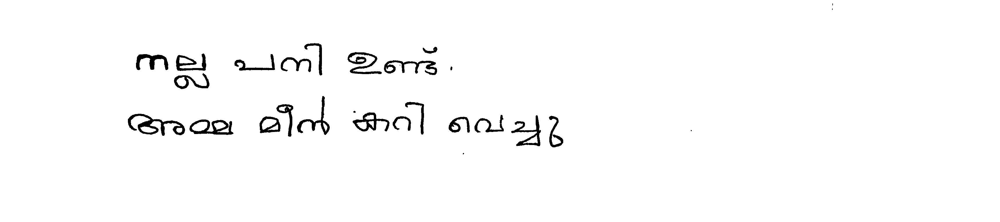


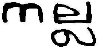
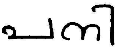
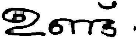


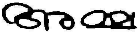
...
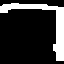


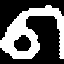
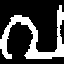
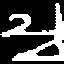
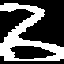

'നചല പനി ഉണ്ട\nഅമ്മ മീൻ കറി ൃവച്ചഭ\n'

In [57]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy import ndimage
import torch
from fastai.vision import *
from fastai.metrics import accuracy
import json
from google.colab import files
from IPython.display import display, HTML, Image
from PIL import Image as PILImage

# Create necessary directories
for folder in ['uploads', 'output/png', 'output/png_x64', 'output/svg', 'output/words']:
    os.makedirs(folder, exist_ok=True)

def predict_alphabets(image_path):
    """Predict Malayalam character from image using pre-trained model"""
    print(f"Predicting character from: {image_path}")
    defaults.device = torch.device("cpu")

    # Malayalam alphabets mapping
    alphabets = ['്', 'ാ', 'ി', 'ീ', 'ു', 'ൂ', 'െ', 'ൃ', 'െ', 'ൌ', 'ം', 'അ', 'ആ', 'ഇ', 'ഉ', 'ഋ', 'എ', 'ഏ', 'ഒ', 'ക', 'ഖ', 'ഗ', 'ഘ', 'ങ', 'ച', 'ഛ', 'ജ', 'ഝ', 'ഞ', 'ട', 'ഠ', 'ഡ', 'ഢ', 'ണ', 'ത', 'ഫ', 'ദ', 'ധ', 'ന', 'പ', 'ഫ', 'ബ', 'ഭ', 'മ', 'യ', 'ര',
                 'റ', 'ല', 'ള', 'ഴ', 'വ', 'ശ', 'ഷ', 'സ', 'ഹ', 'ൺ', 'ൻ', 'ർ', 'ൽ', 'ൾ', 'ക്ക', 'ക്ഷ', 'ങ്ക', 'ങ്ങ', 'ച്ച', 'ഞ്ച', 'ഞ്ഞ', 'ട്ട', 'ണ്ട', 'ണ്ണ', 'ത്ത', 'ദ്ധ', 'ന്ത', 'ന്ദ', 'ന്ന', 'പ്പ', 'മ്പ', 'മ്മ', 'യ്യ', 'ല്ല', 'ള്ള', 'വ്വ', '്യ', '്ര', '്വ']

    # Label mapping (you'll need to download or train these models)
    labels = {'12': 20, '54': 59, '79': 81, '26': 33, '83': 85, '11': 2, '18': 26, '55': 6, '42': 48, '14': 22, '36': 42, '63': 67, '57': 61, '60': 64, '70': 73, '31': 38, '65': 69, '0': 1, '73': 76, '51': 56, '17': 25, '84': 9, '1': 10, '64': 68, '38': 44, '47': 52, '23': 30, '68': 71, '80': 82, '75': 78, '30': 37, '72': 75, '82': 84, '43': 49, '62': 66, '49': 54, '77': 8, '5': 14, '34': 40, '16': 24, '25': 32, '29': 36,
              '39': 45, '21': 29, '74': 77, '46': 51, '44': 5, '27': 34, '35': 41, '37': 43, '58': 62, '9': 18, '4': 13, '41': 47, '40': 46, '81': 83, '67': 70, '59': 63, '69': 72, '52': 57, '78': 80, '15': 23, '33': 4, '24': 31, '22': 3, '76': 79, '10': 19, '3': 12, '50': 55, '28': 35, '6': 15, '19': 27, '2': 11, '7': 16, '53': 58, '32': 39, '61': 65, '8': 17, '13': 21, '45': 50, '71': 74, '44': 5, '48': 53, '56': 60, '20': 28, '66': 7}

    # For demo purposes, we'll need to download the model files first
    # !wget https://example.com/alexnet_non_pretrained_bs32.pkl
    # !wget https://example.com/resnet_18_non-pre_trained.pkl

    # Ensemble models
    ens = ["/content/alexnet_non_pretrained_bs32.pkl", "/content/resnet_18_non-pre_trained.pkl"]
    ens_test_preds = []

    # If models don't exist, return a placeholder
    if not all(os.path.exists(mod) for mod in ens):
        print("Warning: Model files not found. Please download the model files first.")
        return "അ"  # Return a placeholder character

    for mod in ens:
        learn = load_learner(path='.', file=mod)
        img = open_image(image_path)
        pred_class, pred_idx, outputs = learn.predict(img)
        ens_test_preds.append(np.array(outputs))

    ens_preds = np.mean(ens_test_preds, axis=0)
    predicted_char = alphabets[int(labels[str(np.argmax(ens_preds))]) - 1]
    return predicted_char

def _edge_detect(im):
    """Detect edges in image using Sobel operator"""
    return np.max(np.array([_sobel_detect(im[:, :, 0]),
                           _sobel_detect(im[:, :, 1]),
                           _sobel_detect(im[:, :, 2])]), axis=0)

def _sobel_detect(channel):
    """Apply Sobel edge detection to an image channel"""
    sobelX = cv2.Sobel(channel, cv2.CV_16S, 1, 0)
    sobelY = cv2.Sobel(channel, cv2.CV_16S, 0, 1)
    sobel = np.hypot(sobelX, sobelY)
    sobel[sobel > 255] = 255
    return np.uint8(sobel)

def sort_words(boxes):
    """Sort word boxes horizontally (left to right)"""
    # Sort boxes by x-coordinate (horizontal position)
    return sorted(boxes, key=lambda box: box[2])

def sort_lines(boxes):
    """Sort boxes into lines by vertical position (top to bottom)"""
    # Sort all boxes by y-coordinate (vertical position)
    return sorted(boxes, key=lambda box: box[0])

def group_into_lines(boxes, max_y_distance=20):
    """Group boxes into lines based on vertical position"""
    if not boxes:
        return []

    # First sort boxes by vertical position
    sorted_boxes = sort_lines(boxes)

    lines = []
    current_line = [sorted_boxes[0]]
    current_y = sorted_boxes[0][0]  # Top y-coordinate of first box

    for box in sorted_boxes[1:]:
        # If this box is close enough vertically to the current line
        if abs(box[0] - current_y) <= max_y_distance:
            current_line.append(box)
        else:
            # Start a new line
            lines.append(sort_words(current_line))  # Sort words in the line horizontally
            current_line = [box]
            current_y = box[0]

    # Add the last line
    if current_line:
        lines.append(sort_words(current_line))

    return lines

def scale_boxes(new_img, old_img, coords):
    """Scale coordinates from one image size to another"""
    coords[0] = int((coords[0]) * new_img.shape[0] / old_img.shape[0])  # new top left
    coords[1] = int((coords[1]) * new_img.shape[0] / old_img.shape[0])  # new bottom left
    coords[2] = int((coords[2]) * new_img.shape[1] / old_img.shape[1])  # new top right
    coords[3] = int((coords[3]) * new_img.shape[1] / old_img.shape[1])  # new bottom right
    return coords

def clipping_image(new):
    """Clip image to content boundaries"""
    colsums = np.sum(new, axis=0)
    linessum = np.sum(new, axis=1)
    colsums2 = np.nonzero(0-colsums)
    linessum2 = np.nonzero(0-linessum)

    if linessum2[0].size == 0 or colsums2[0].size == 0:
        return new, [0, new.shape[0], 0, new.shape[1]]

    x = linessum2[0][0]  # top left
    xh = linessum2[0][linessum2[0].shape[0]-1]  # bottom left
    y = colsums2[0][0]  # top right
    yw = colsums2[0][colsums2[0].shape[0]-1]  # bottom right

    imgcrop = new[x:xh, y:yw]  # crop the image

    return imgcrop, [x, xh, y, yw]

def padding_resizing_image(img, reduce_size):
    """Add padding and resize image"""
    # Add padding to image
    img = cv2.copyMakeBorder(img, 2, 2, 0, 0, cv2.BORDER_CONSTANT)
    try:
        # Resize the image to specified size
        img = cv2.resize(np.uint8(img), (reduce_size, reduce_size))
    except Exception as e:
        print(f"Error resizing image: {e}")
    return img

def segmentation(img, sequence, origimg=None, lineNo=None, wordNo=None, filename=None):
    """Segment image into lines, words or characters with reduced preprocessing"""
    if sequence == "line":  # resize to find lines
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 10  # Reduced from 20
    elif sequence == "word":  # resize to find the words
        width = 940
        height = int(img.shape[0] * (width / img.shape[1]))
        sigma = 8  # Reduced from 18
    elif sequence == "character":  # resize to find the characters
        width = img.shape[1]
        height = img.shape[0]
        sigma = 0

    img = cv2.resize(img, (width, height))

    # Apply lighter blur for line and word segmentation
    if sequence in ["line", "word"]:
        blurred = cv2.GaussianBlur(img, (3, 3), sigma)  # Smaller kernel (3x3 instead of 5x5)
        blurred = _edge_detect(blurred)
        # Otsu's thresholding with Binary
        ret, img = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

        if sequence == "line":
            # Use smaller kernel for line detection
            kernel = np.ones((3, 40), np.uint8)  # Reduced from 5x80
            img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
        else:  # word
            # Use smaller kernel for word detection
            kernel = np.ones((10, 10), np.uint8)  # Reduced from 15x15
            img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    elif sequence == "character":
        # For character segmentation, try a gentle Gaussian blur before thresholding
        img = cv2.GaussianBlur(img, (3, 3), 1)
        # Otsu's thresholding with Binary Inverted
        ret, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

    num_labels, labels_im = cv2.connectedComponents(img)  # find connected components

    if sequence in ["line", "word"]:
        boxes = []  # for storing the coordinates of the bounding boxes
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)

            # Filter out very small boxes
            min_height = 10
            min_width = 10
            if sequence == "line":
                min_width = 100  # Lines should be wider

            if not (new.shape[0] < min_height or new.shape[1] < min_width):
                boxes.append(new_coord)

        return img, boxes

    if sequence == "character":
        boxes = []
        label_box = []
        for i in range(1, num_labels):
            # select the images with label
            new, nr_objects = ndimage.label(labels_im == i)
            # clipping the image to the edges
            new, new_coord = clipping_image(new)
            if not (new.shape[0] < 10 or new.shape[1] < 10):
                label_box.append([i, new_coord])

        # Sort characters horizontally
        label_box = sorted(label_box, key=lambda x: x[1][2])  # Sort by x coordinate
        chNo = 0

        # Create output directory if it doesn't exist
        os.makedirs(os.path.join('output/png', filename), exist_ok=True)
        os.makedirs(os.path.join('output/png_x64', filename), exist_ok=True)

        for box in label_box:
            ch_img, nr_objects = ndimage.label(labels_im == box[0])
            ch_img, new_coord = clipping_image(ch_img)
            cropped_image = padding_resizing_image(ch_img, 32)
            cropped_image_x64 = padding_resizing_image(ch_img, 64)

            try:
                dst = os.path.join('output/png', filename, f"{lineNo}_{wordNo}_{chNo}.png")
                dst_x64 = os.path.join('output/png_x64', filename, f"{lineNo}_{wordNo}_{chNo}.png")
                plt.imsave(dst, cropped_image, cmap=cm.gray)
                plt.imsave(dst_x64, cropped_image_x64, cmap=cm.gray)
            except Exception as e:
                print(f"Error saving segmented character: {e}")

            chNo += 1

        return img, boxes

def img_to_seg(img, filename):
    """Segment image into lines, words and characters with minimal preprocessing"""
    # Change image width to 1280px but only if necessary
    if img.shape[1] > 1280:
        img = cv2.resize(img, (1280, int(img.shape[0] * (1280 / img.shape[1]))))

    # Use a smaller kernel and lighter opening
    kernel = np.ones((3, 3), np.uint8)  # Reduced from 5x5
    # Consider making the opening optional or lighter
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1)

    # Rest of the function remains the same...

    # Step 1: Line segmentation
    new_img, line_boxes = segmentation(img, "line")
    if not line_boxes:
        return "0", 0

    # Group boxes into lines
    line_boxes = group_into_lines(line_boxes)

    # Scale line coordinates to original image
    scaled_line_boxes = []
    for line in line_boxes:
        scaled_line = []
        for box in line:
            scaled_box = scale_boxes(img, new_img, box.copy())
            scaled_line.append(scaled_box)
        scaled_line_boxes.append(scaled_line)

    # Process each line
    lineNo = 0
    total_words = 0
    line_word_counts = {}
    word_images = {}  # Store word images for display

    # Create output directory for word images
    os.makedirs(os.path.join('output/words', filename), exist_ok=True)

    for line_boxes in scaled_line_boxes:
        line_img = img[min(box[0] for box in line_boxes):max(box[1] for box in line_boxes), :]

        # Word segmentation within the line
        word_img, word_boxes = segmentation(line_img, "word")
        if not word_boxes:
            continue

        # Scale word coordinates to line image
        scaled_word_boxes = []
        for box in word_boxes:
            scaled_box = scale_boxes(line_img, word_img, box.copy())
            scaled_word_boxes.append(scaled_box)

        # Sort words horizontally
        scaled_word_boxes = sort_words(scaled_word_boxes)

        wordNo = 0
        line_word_counts[lineNo] = 0
        word_images[lineNo] = {}

        for word_box in scaled_word_boxes:
            # Check if the coordinates are valid
            if word_box[0] >= word_box[1] or word_box[2] >= word_box[3]:
                continue
            if word_box[0] < 0 or word_box[2] < 0 or word_box[1] >= line_img.shape[0] or word_box[3] >= line_img.shape[1]:
                continue

            # Extract word image
            word_img_rgb = line_img[word_box[0]:word_box[1], word_box[2]:word_box[3]]
            word_img_gray = cv2.cvtColor(word_img_rgb, cv2.COLOR_BGR2GRAY)

            # Save word image
            word_path = os.path.join('output/words', filename, f"{lineNo}_{wordNo}.png")
            plt.imsave(word_path, word_img_rgb)
            word_images[lineNo][wordNo] = word_path

            # Segment into characters
            char_img, _ = segmentation(word_img_gray, "character", None, lineNo, wordNo, filename)
            wordNo += 1
            line_word_counts[lineNo] += 1
            total_words += 1

        lineNo += 1

    return "1", total_words, line_word_counts, word_images

# Function to process the uploaded image
def process_image(img_path):
    """Process the uploaded image and recognize text"""
    filename = os.path.basename(img_path)
    base_filename = os.path.splitext(filename)[0]

    # Create output directories
    for subdir in ['png', 'png_x64', 'svg', 'words']:
        os.makedirs(os.path.join('output', subdir, base_filename), exist_ok=True)

    # Read and process the image
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    status, word_count, line_word_counts, word_images = img_to_seg(img, base_filename)

    if status != "1" or word_count == 0:
        return "No text was detected in the image. Please try with a clearer image."

    # Dictionary to store predicted characters
    alpha = {}
    for line_no in line_word_counts:
        alpha[str(line_no)] = {}
        for word_no in range(line_word_counts[line_no]):
            alpha[str(line_no)][str(word_no)] = {}

    # Process each character image and predict
    for f in os.listdir(os.path.join('output/png', base_filename)):
        if not f.endswith('.png'):
            continue

        try:
            character = predict_alphabets(os.path.join('output/png', base_filename, f))
            parts = f.split("_")
            line_idx = parts[0]
            word_idx = parts[1]
            char_idx = parts[2].split(".")[0]

            if line_idx not in alpha:
                alpha[line_idx] = {}
            if word_idx not in alpha[line_idx]:
                alpha[line_idx][word_idx] = {}

            alpha[line_idx][word_idx][char_idx] = character
        except Exception as e:
            print(f"Error predicting character {f}: {e}")

    # Construct recognized text
    paragraph = ""

    # Process each line
    for line_no in sorted(alpha.keys(), key=int):
        line_text = ""

        # Process each word in the line
        for word_no in sorted(alpha[line_no].keys(), key=int):
            word_text = ""

            # Process each character in the word
            for char_no in sorted(alpha[line_no][word_no].keys(), key=int):
                word_text += alpha[line_no][word_no][char_no]

            if word_text:
                line_text += word_text + " "

        if line_text:
            paragraph += line_text.strip() + "\n"

    # Display the results
    display(HTML(f"<h2>Recognized Text:</h2><p style='font-size:20px; white-space: pre-line;'>{paragraph}</p>"))

    # Display the original image
    display(HTML("<h2>Original Image:</h2>"))
    display(PILImage.open(img_path))

    # Display segmented words
    display(HTML("<h2>Segmented Words:</h2>"))

    for line_idx in sorted(word_images.keys(), key=int):
        display(HTML(f"<h3>Line {int(line_idx)+1}:</h3>"))

        line_display = "<div style='display:flex; flex-wrap:wrap; gap:10px; margin-bottom:15px;'>"

        for word_idx in sorted(word_images[line_idx].keys(), key=int):
            word_img_path = word_images[line_idx][word_idx]

            # Get the predicted text for this word
            word_text = ""
            if line_idx in alpha and word_idx in alpha[str(line_idx)]:
                for char_idx in sorted(alpha[str(line_idx)][str(word_idx)].keys(), key=int):
                    word_text += alpha[str(line_idx)][str(word_idx)][char_idx]

            # Create a base64 representation of the image for display
            with open(word_img_path, "rb") as img_file:
                img_data = img_file.read()
                img_base64 = base64.b64encode(img_data).decode('utf-8')

            line_display += f"""
            <div style='border:1px solid #ddd; border-radius:5px; padding:10px; text-align:center;'>
                <img src='data:image/png;base64,{img_base64}' style='max-height:100px; max-width:200px;' />
                <div style='margin-top:5px; font-weight:bold;'>{word_text}</div>
            </div>
            """

        line_display += "</div>"
        display(HTML(line_display))

    # Display the segmented characters with line and word structure
    display(HTML("<h2>Segmented Characters:</h2>"))

    for line_idx in sorted(alpha.keys(), key=int):
        display(HTML(f"<h3>Line {int(line_idx)+1}:</h3>"))

        for word_idx in sorted(alpha[line_idx].keys(), key=int):
            word_display = f"<div style='display:flex; margin-bottom:10px;'>"

            for char_idx in sorted(alpha[line_idx][word_idx].keys(), key=int):
                char_img_path = os.path.join('output/png_x64', base_filename, f"{line_idx}_{word_idx}_{char_idx}.png")
                if os.path.exists(char_img_path):
                    char = alpha[line_idx][word_idx][char_idx]

                    # Create a base64 representation of the image for display
                    with open(char_img_path, "rb") as img_file:
                        img_data = img_file.read()
                        img_base64 = base64.b64encode(img_data).decode('utf-8')

                    word_display += f"<div style='text-align:center; margin-right:5px;'><img src='data:image/png;base64,{img_base64}' width='50'/><br/>{char}</div>"

            word_display += "</div>"
            display(HTML(word_display))

    return paragraph

# Function to handle file upload
def upload_and_process():
    """Upload and process image"""
    uploaded = files.upload()

    if not uploaded:
        print("No file was uploaded.")
        return

    filename = list(uploaded.keys())[0]
    file_path = os.path.join('uploads', filename)

    # Save the uploaded file
    with open(file_path, 'wb') as f:
        f.write(uploaded[filename])

    # Process the image
    result = process_image(file_path)
    return result

# UI for uploading and processing image
from IPython.display import HTML, display
import base64

display(HTML("""
<div style="background-color:#f8f9fa; padding:20px; border-radius:10px; margin-bottom:20px;">
    <h1 style="text-align:center; color:#343a40;">Malayalam Handwritten Paragraph Recognition</h1>
    <p style="text-align:center; color:#6c757d;">Upload an image with handwritten Malayalam paragraphs</p>
</div>
"""))

print("Note: You need to upload the pre-trained models 'alexnet_non_pretrained_bs32.pkl' and 'resnet_18_non-pre_trained.pkl' for this to work properly.")
print("For demo purposes, the character prediction will return a placeholder if models are not found.")

# Call the upload function
upload_and_process()